# Data Cleaning EDA

This notebook focuses on exploring ways to filter and clean the data.
It is a follow-up to the intial EDA notebook.
The overall goal is to determine repeatable methods to remove bad data and outliers from the dataset so these methods can be applied to any dataset we wish to use to train or test models.
The assumption here is that real world data will fall within these limits.

In [110]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import LocalOutlierFactor

Let's load the data and add in additional features, bins, and polar coordinates.

In [111]:
df = pd.read_parquet("/home/joe/datum/fare_amount_init_6_8_2023.parquet")
# Cut down the columns not needed
target = "fare_amount"
numeric_feats = ["trip_distance", "trip_duration_min",]
df = df[numeric_feats + [target]]
# Add in new columns
df["travel_rate"] = df["trip_distance"] / (df["trip_duration_min"] / 60)
# Round the trip duration to 2 decimal places
df["trip_duration_min"] = df["trip_duration_min"].round(2) 
# Round travel rate to 2 decimal places
df["travel_rate"] = df["travel_rate"].round(2) 
df['r'] = np.sqrt(df["trip_distance"]**2 + df["trip_duration_min"]**2)
df["theta"] = np.arccos(df["trip_distance"]/ df["r"]) * (360/(2*np.pi))
price_bins = [x for x in range(0,75,5)]
bins = price_bins[1:]
df["price_bin"] = pd.cut(df["fare_amount"], bins=price_bins, labels=bins)

When filtering and cleaning data, it is important to utilize domain knowledge and statistics to filter out data.
Filtering rules should be conservative enough to remove data but not remove too much data and pose a risk of stripping legitimate datapoints from the dataset.

There are some basic rules that can be formulated right off the bat.

## Pure Domain Knowledge Filtering

### Rule 1: Overall MPH <= 65 MPH

count    7.785073e+06
mean     1.095850e+01
std      5.781326e+00
min      1.000000e-02
25%      7.340000e+00
50%      9.710000e+00
75%      1.296000e+01
max      1.205710e+03
Name: travel_rate, dtype: float64 

Lower Outlier Limit : -1.0900000000000016
Upper Outlier Limit : 21.39


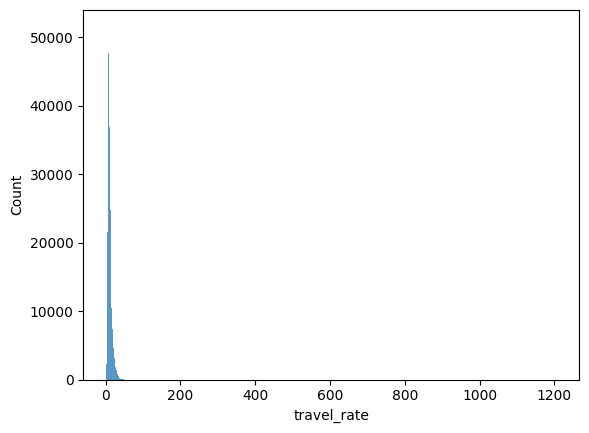

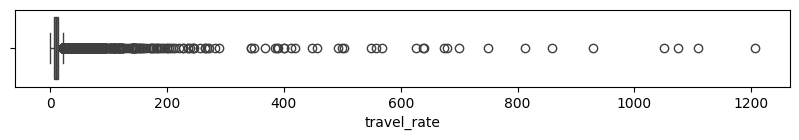

In [68]:
feat = "travel_rate"
summary = df[feat].describe()
print(summary, "\n")
iqr = summary.loc["75%"] - summary.loc["25%"]
upper_limit = summary.loc["75%"] + 1.5*iqr
lower_limit = summary.loc["25%"] - 1.5*iqr
print("Lower Outlier Limit :", lower_limit)
print("Upper Outlier Limit :", upper_limit)

sns.histplot(data=df, x=feat)
plt.show()
fig = plt.subplots(figsize=(10,1))
sns.boxplot(data=df, x=feat)
plt.show()

Overall speed (MPH) is a good place to start. Nobody in NYC is travelling at 200 MPH, unless you are Batman or The Flash.
Let's estalish a rule that overall speed should be less that 65MPH.
It's definitely outside of the upper limit defined by the IQR method for outliers, but also reasonable to say some taxi trips go on the freeway.
This rule can be adjusted later if trips with higher average speeds poses a problem.

In [112]:
df.loc[df["travel_rate"] > 65].shape

(204, 7)

Only 204 data points removed. That's a good sign!

In [113]:
df = df.loc[df["travel_rate"] <= 65]

### Rule 2 : Fare Price Limit Assuming Distance and Duration Fully Count (Fare Amount is Too Much)
This rule is somewhat impossible because it assumes that the duration and distance fully count towards fare price, but we know that's not true.
Nevertheless, it is an easy to accept limit.
Also, $3 must be subtracted from the fare amount based on the pricing model.

In [71]:
df.loc[df["fare_amount"]-3 > 0.7*df["trip_duration_min"].apply(np.floor)+ 0.7*np.floor(5*df["trip_distance"])].shape

(24908, 7)

Interesting to see that ~25k rows have fare amounts that are impossible.

In [114]:
df = df.loc[df["fare_amount"]-3 <= 0.7*df["trip_duration_min"].apply(np.floor)+ 0.7*np.floor(5*df["trip_distance"])]

## Domain Knowledge + Math + Statistics

In the initial EDA notebook, price bins of $10 and $20 clearly had some outliers and bogus data.
Let's re-examine the data but using $5 bucket sizes for binning and then think about if there are any sensible rules that can be applied to the data.

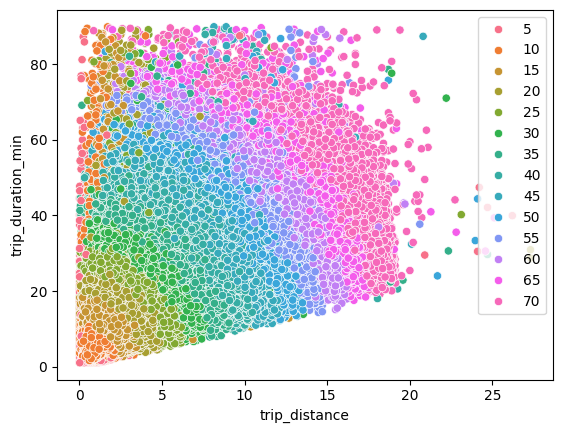

In [23]:
sns.scatterplot(data=df, x="trip_distance", y="trip_duration_min", hue="price_bin")
plt.legend(loc='upper right')
plt.show()

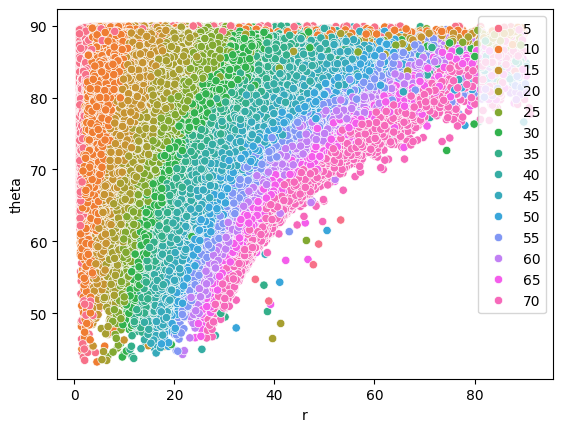

In [24]:
sns.scatterplot(data=df, x="r", y="theta", hue="price_bin")
plt.legend(loc='upper right')
plt.show()

### Each Bin in Polar Coordinates
Now to examine each bin in polar coordinates

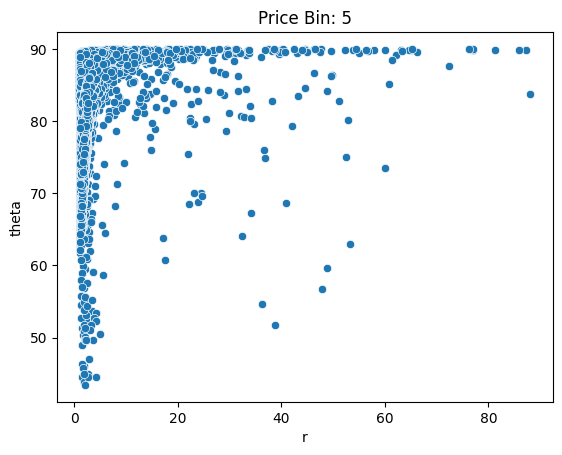

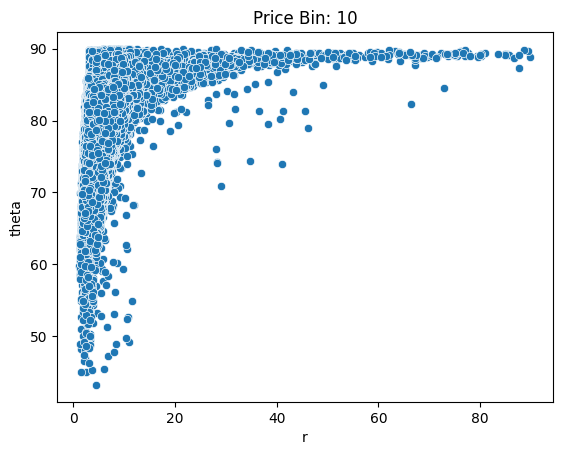

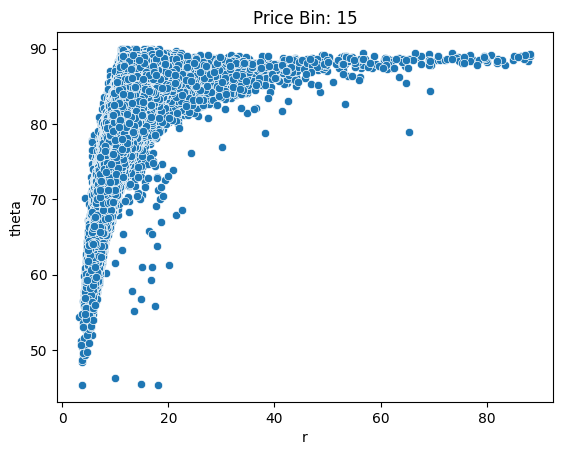

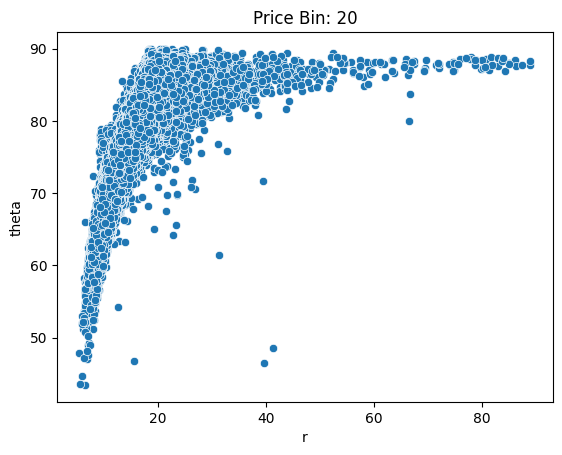

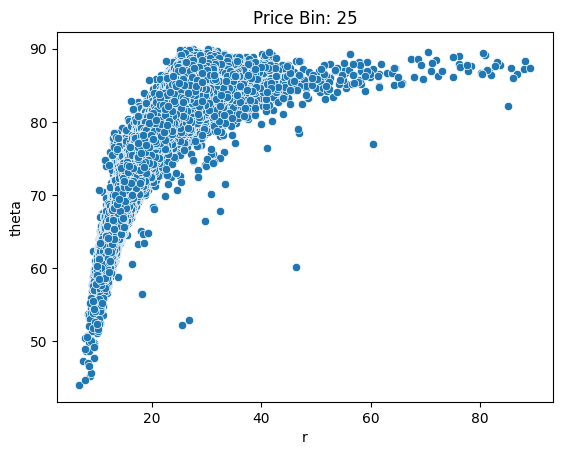

...

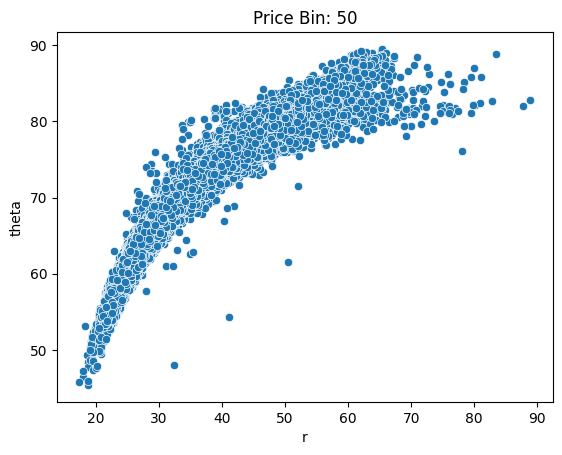

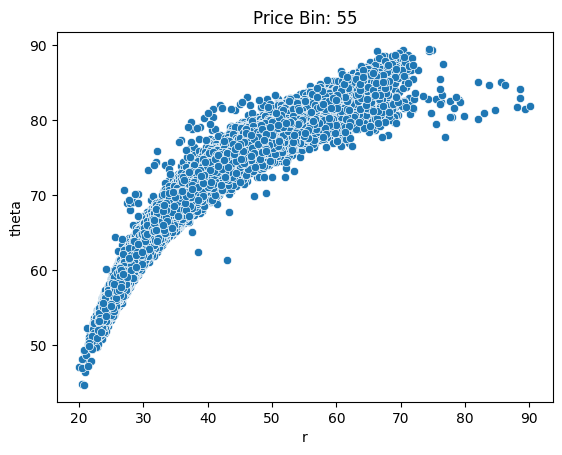

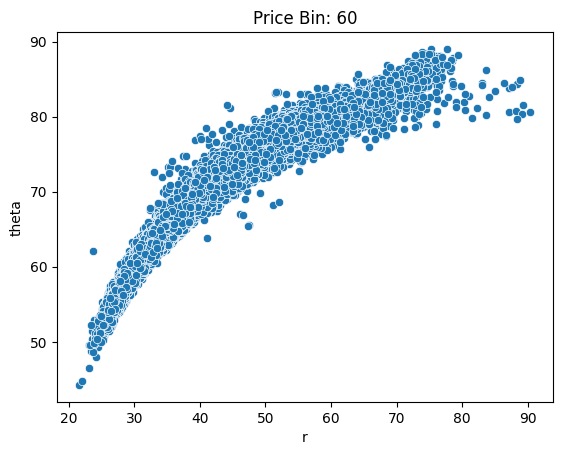

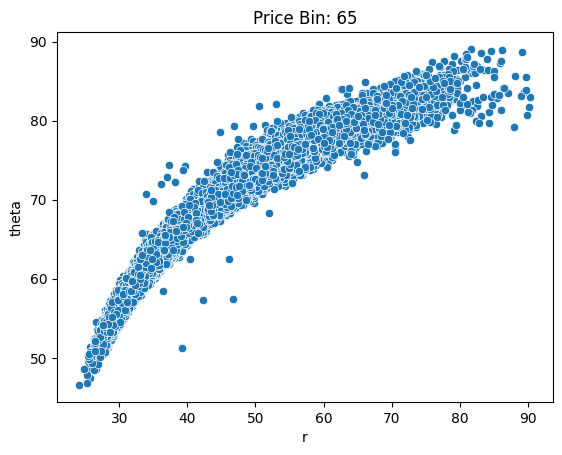

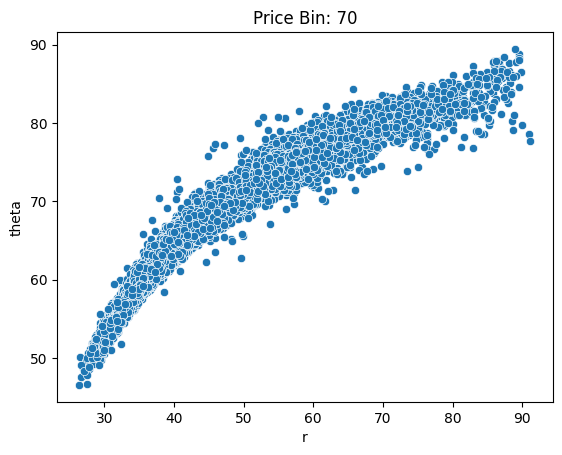

In [25]:
for bin in bins:
    sns.scatterplot(data=df.loc[df["price_bin"] == bin], x="r", y="theta")
    plt.title(f"Price Bin: {bin}")
    plt.show()

### Each Bin in Cartesian Coordinates
Now to examine each bin in Cartesian coordinates

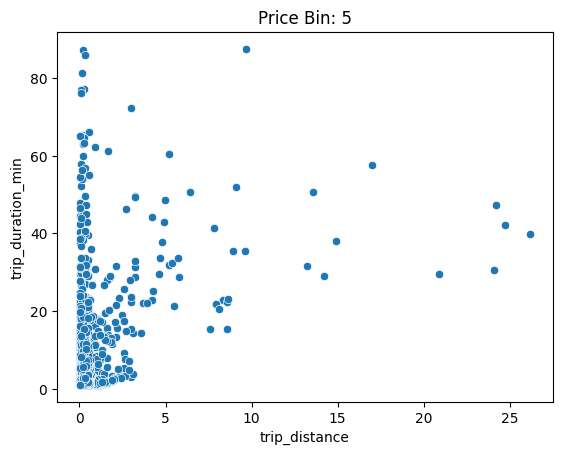

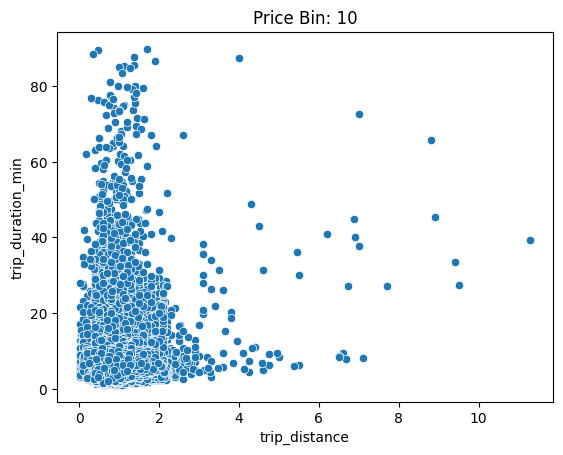

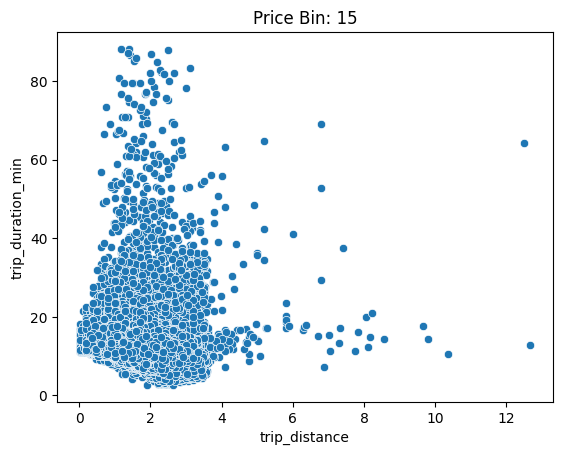

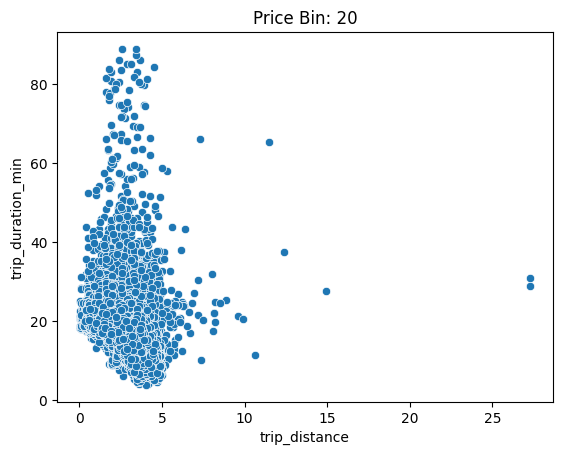

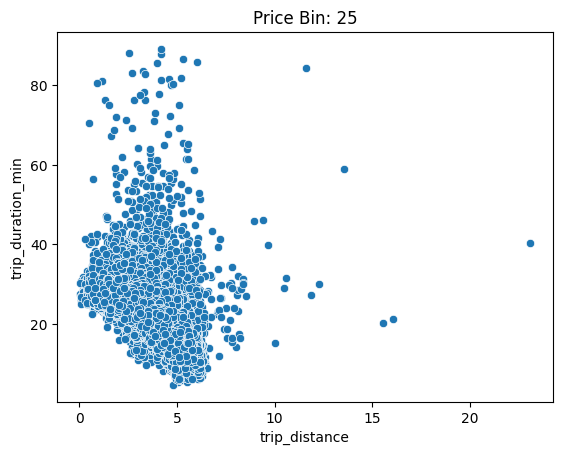

...

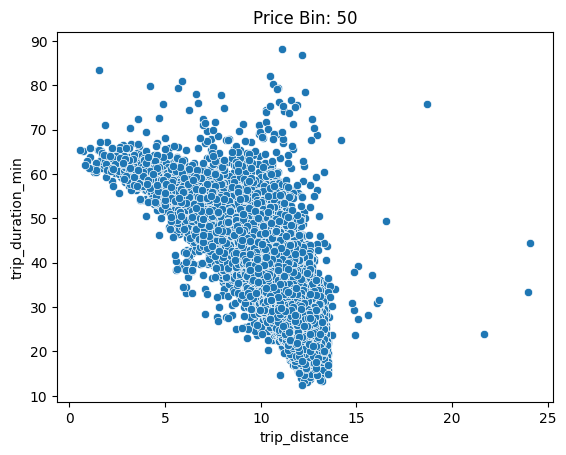

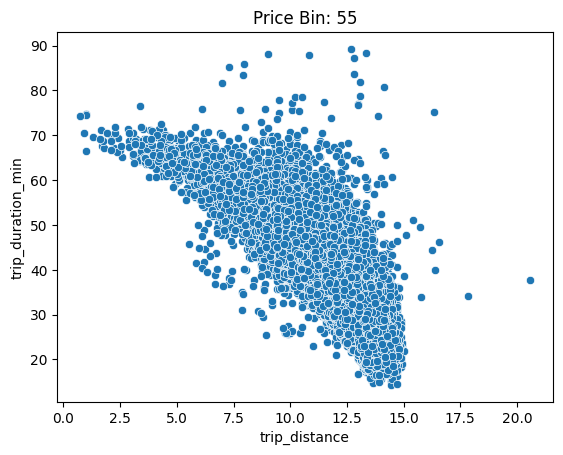

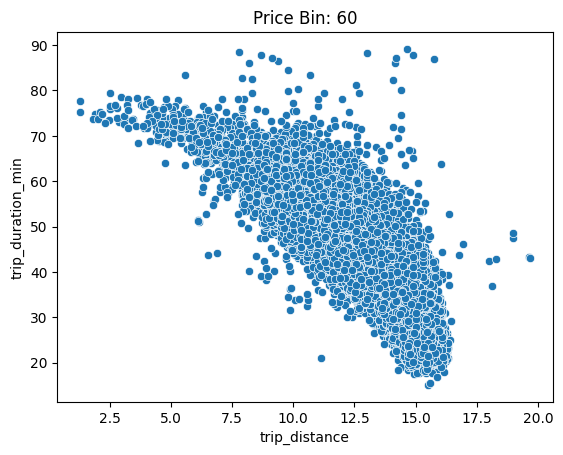

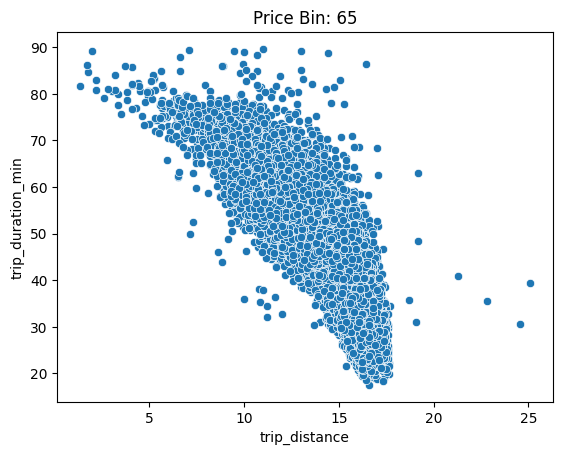

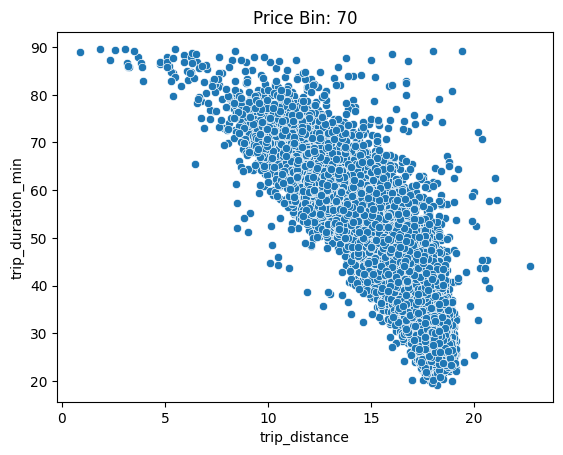

In [26]:
for bin in bins:
    sns.scatterplot(data=df.loc[df["price_bin"] == bin], x="trip_distance", y="trip_duration_min")
    plt.title(f"Price Bin: {bin}")
    plt.show()

### Observations of Price Bins

Some data points simply do not make sense for lower price bins.
There's absolutely no way that a trip that takes more than an hour costs $5.
So now we need to think about how can we mathematically elimiate those bad datapoints.
This issue is when the reported fare amount is too low for the trip distance and duration.
Some rules to filter out this issue can be developed.

The reality of the situation is the data doesn't provide the number of 1/5 miles that were traveled at speeds > 12 MPH, nor the number of whole minutes of the trip traveled at speeds <= 12 MPH.
So there's no clear-cut way to identify bogus fare amounts on a record-by-record basis.

Thinking about domain knowledge, trips that average 12MPH or less are more likely to have the fare amount determined by the trip duration instead of the distance.
The likelihood grows more plausible with the lower the average speed.
This method may not be perfect and reducing the threshold for average MPH might be better, but still may not be perfect.
The decision on the averag speed threshold comes down to judgement.
Selecting the threshold of 12MPH is problematic because it implies there were speeds traveled above 12PMH, but the same arguement could be extended to lower thresholds depending on contextual data.
A threshold of 10 MPH seems reasonable enough, and will be used.


It is worth mentioning that even if this rule still leaves in some bad data, the hope is that removing a sufficient amount of bad data can enable the possibility of utilizing multivariate outlier detection methods to clean the rest of the data.
If there's too much bad data then it poses a risk that the outlier detection methods may not be able to easily detect outliers.

To find bad data, the trip duration will be assumed to account for the entire fare amount.
The estimated fare amount will be computed, then the delta between the fare amount and estimated fare amount will be calculated.
By examining the errors and looking for outliers, some bad datapoints can be identified and removed

In [118]:
df_slow = df.loc[df["travel_rate"] <= 10.00]

In [119]:
df_slow.shape

(4103099, 7)

In [120]:
# Calculate estimate fare
df_slow["est_fare_dur"] = 3 + 0.7*df_slow["trip_duration_min"]
df_slow["fare_delta"] = df_slow["fare_amount"] - df_slow["est_fare_dur"]

/tmp/ipykernel_46699/2574577361.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_slow["est_fare_dur"] = 3 + 0.7*df_slow["trip_duration_min"]
/tmp/ipykernel_46699/2574577361.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_slow["fare_delta"] = df_slow["fare_amount"] - df_slow["est_fare_dur"]


count    4.103099e+06
mean     9.019726e-01
std      1.509426e+00
min     -6.058500e+01
25%      1.190000e-01
50%      6.510000e-01
75%      1.470000e+00
max      2.796500e+01
Name: fare_delta, dtype: float64 

Lower Outlier Limit : -1.9074999999999966
Upper Outlier Limit : 3.496499999999996


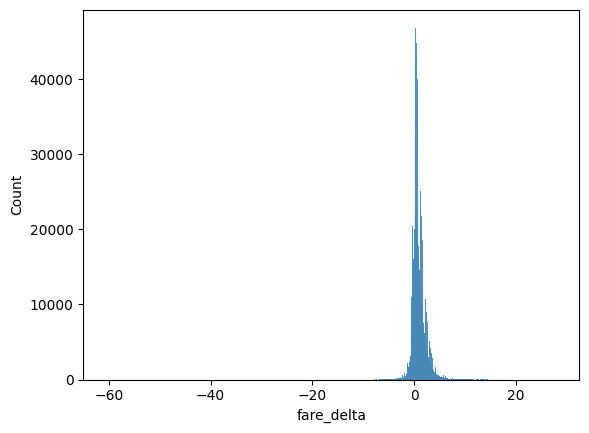

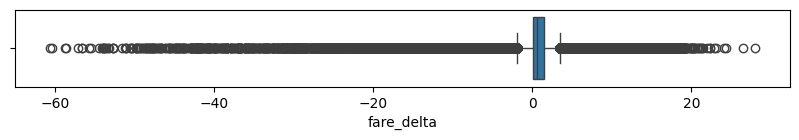

In [121]:
feat = "fare_delta"
summary = df_slow[feat].describe()
print(summary, "\n")
iqr = summary.loc["75%"] - summary.loc["25%"]
upper_limit = summary.loc["75%"] + 1.5*iqr
lower_limit = summary.loc["25%"] - 1.5*iqr
print("Lower Outlier Limit :", lower_limit)
print("Upper Outlier Limit :", upper_limit)

sns.histplot(data=df_slow, x=feat)
plt.show()
fig = plt.subplots(figsize=(10,1))
sns.boxplot(data=df_slow, x=feat)
plt.show()

Negative fare deltas identify fare amounts that are too low.
Positive fare deltas may not be invalid because the assumption that the trip duration only mattered for fare price may not hold.
The lower outlier limit for the fare delta seems to be a good cutoff to use to remove the bad data.

In [122]:
df_slow["outlier"] = df_slow["fare_delta"].apply(lambda x :  1 if x < -1.9074999999999966 else 0)

/tmp/ipykernel_46699/2972380942.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_slow["outlier"] = df_slow["fare_delta"].apply(lambda x :  1 if x < -1.9074999999999966 else 0)


#### Polar Coordinate Plots of Outliers

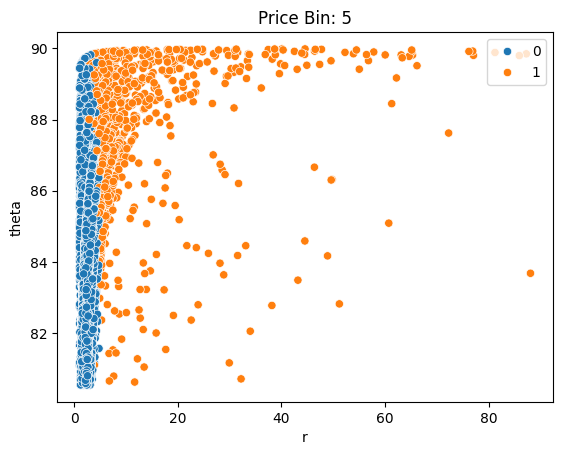

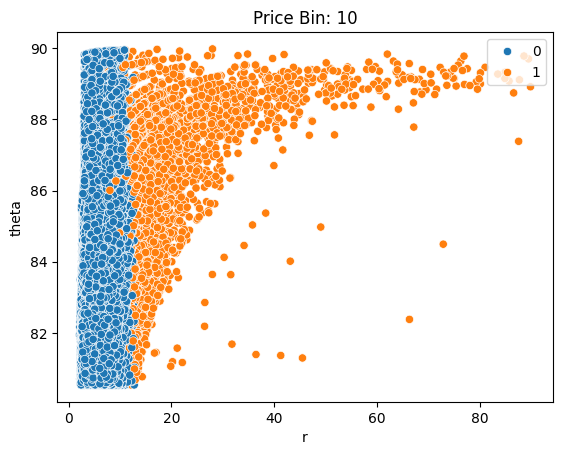

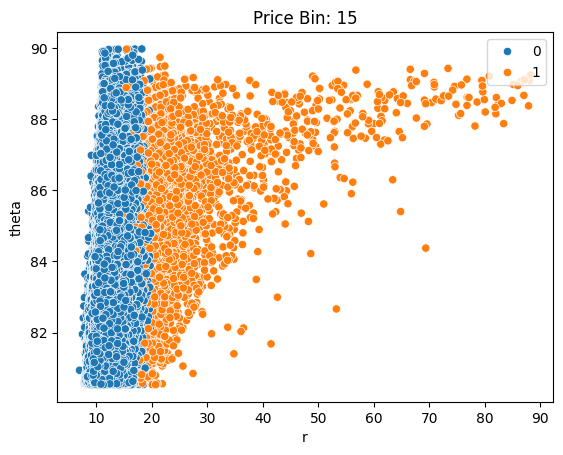

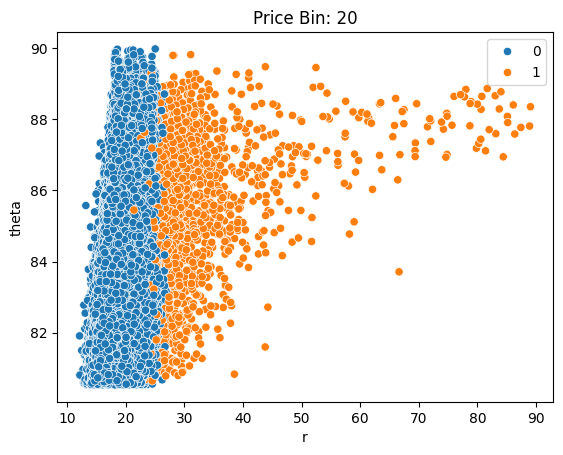

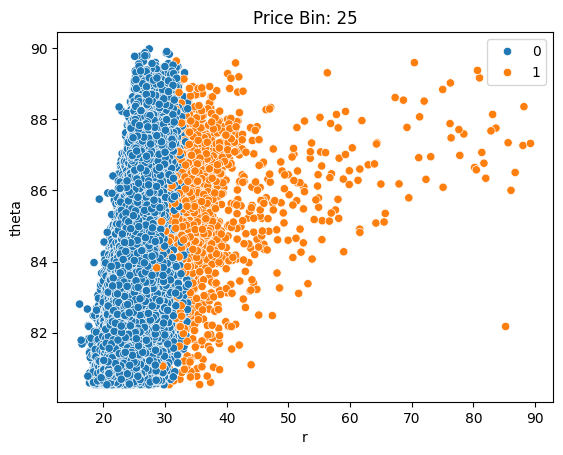

...

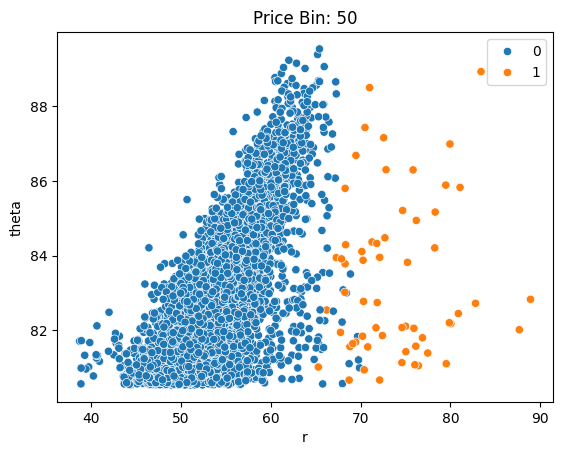

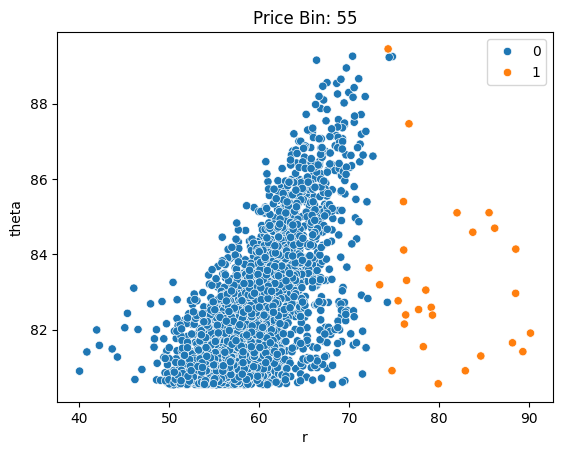

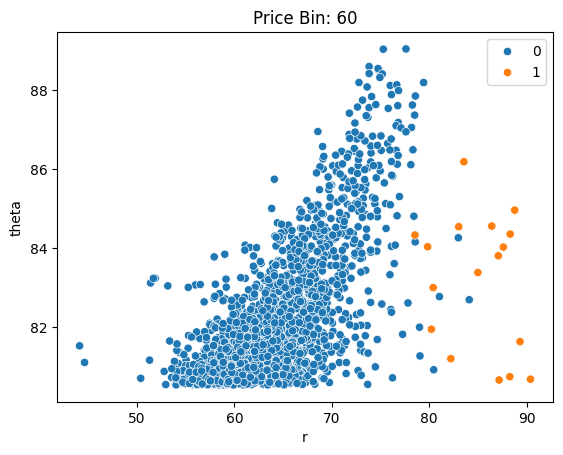

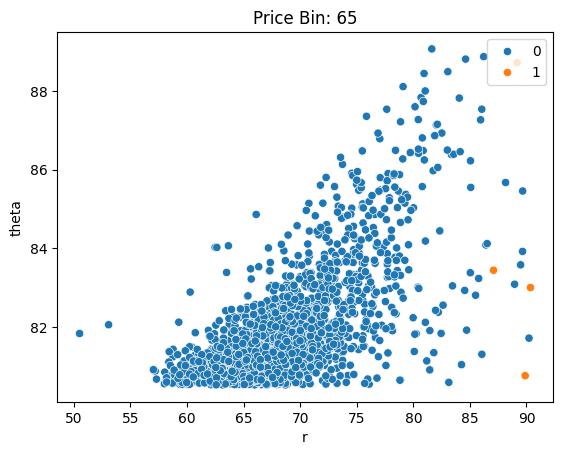

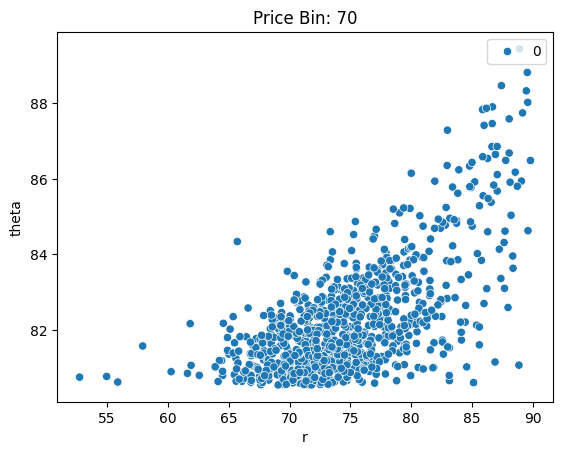

In [78]:
for bin in bins:
    sns.scatterplot(data=df_slow.loc[df_slow["price_bin"] == bin], x="r", y="theta", hue="outlier")
    plt.title(f"Price Bin: {bin}")
    plt.legend(loc='upper right')
    plt.show()

#### Catesian Coordinate Plots of Outliers

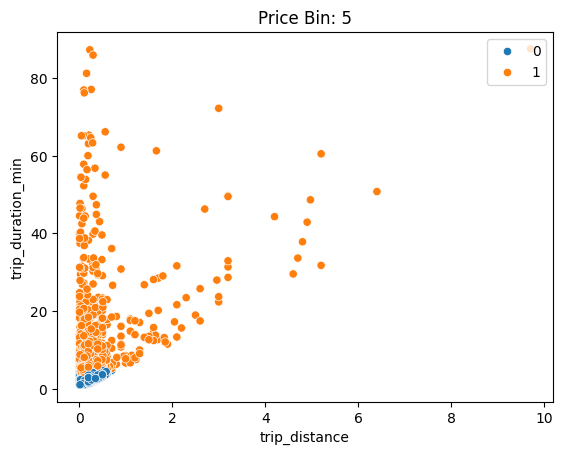

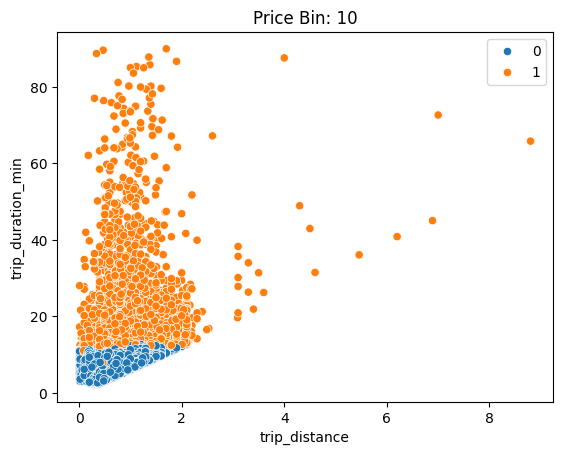

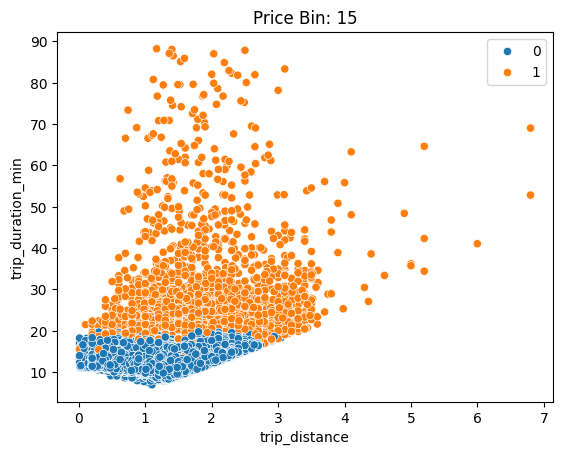

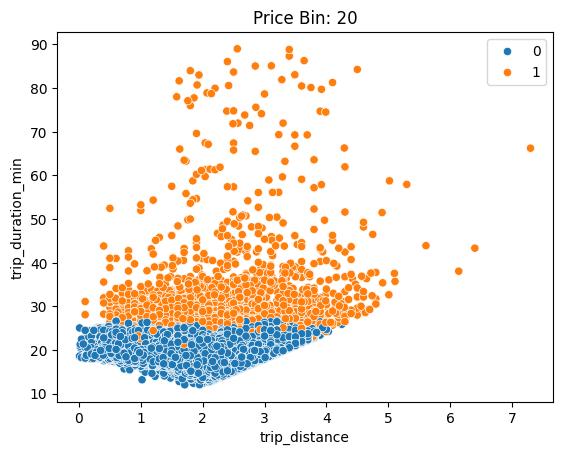

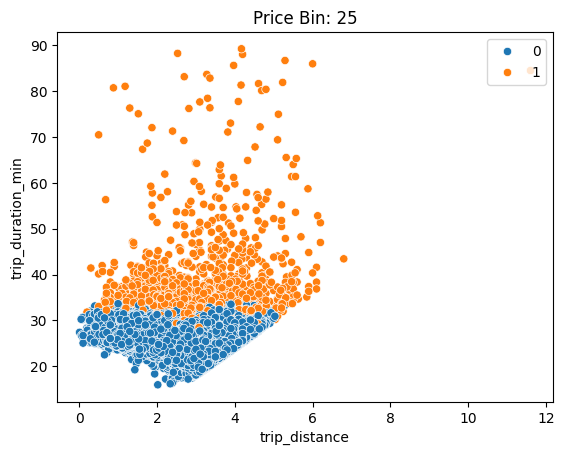

...

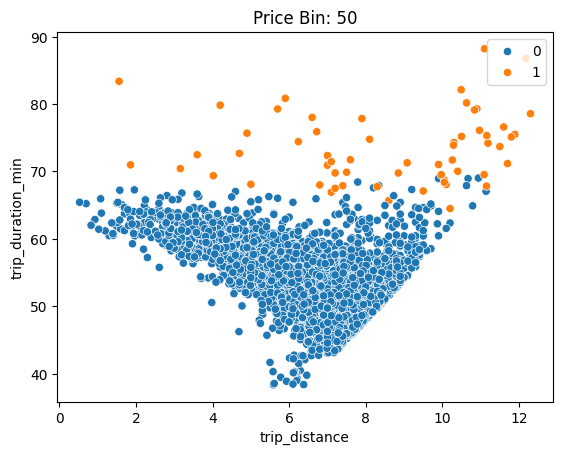

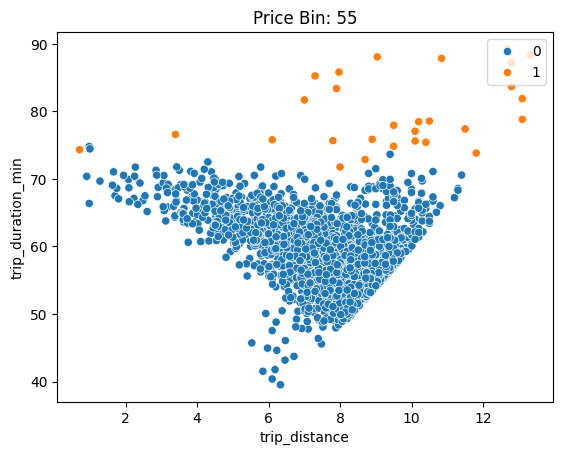

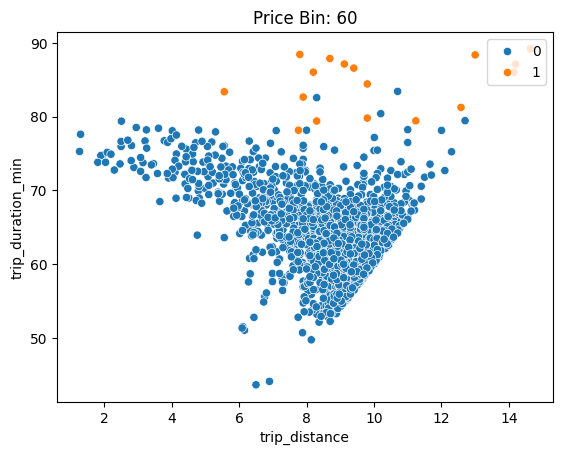

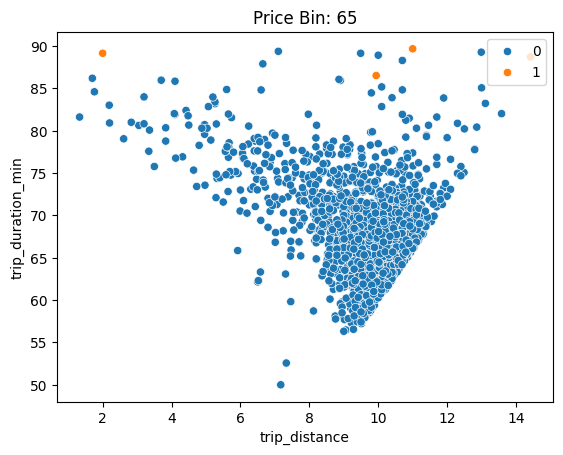

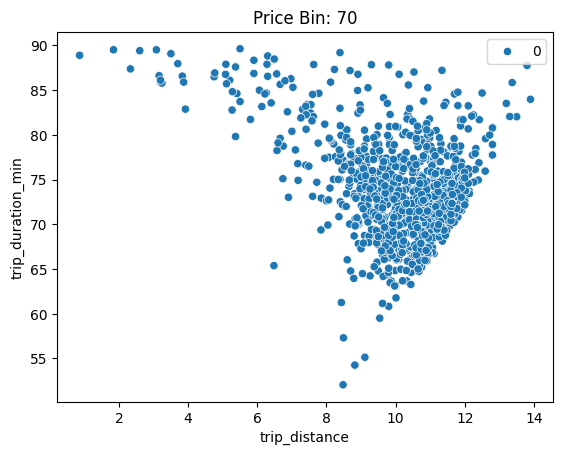

In [79]:
for bin in bins:
    sns.scatterplot(data=df_slow.loc[df_slow["price_bin"] == bin], x="trip_distance", y="trip_duration_min", hue="outlier")
    plt.title(f"Price Bin: {bin}")
    plt.legend(loc='upper right')
    plt.show()

#### Removing Outliers

In [123]:
idx_slow = df_slow.loc[df_slow["outlier"] == 1].index

In [124]:
df.drop(idx_slow, inplace=True)

## Reviewing Data So Far

Let's review the data now that some outliers have been removed.

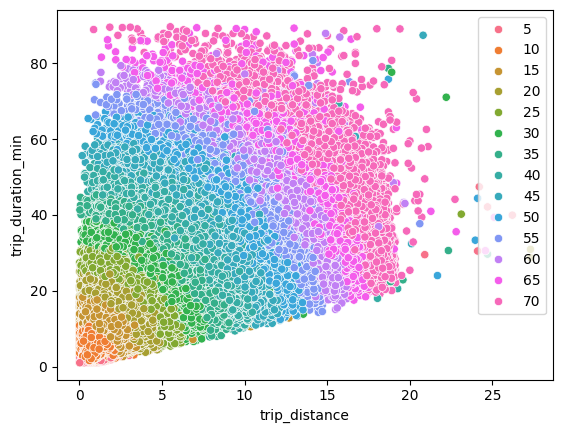

In [125]:
sns.scatterplot(data=df, x="trip_distance", y="trip_duration_min", hue="price_bin")
plt.legend(loc='upper right')
plt.show()

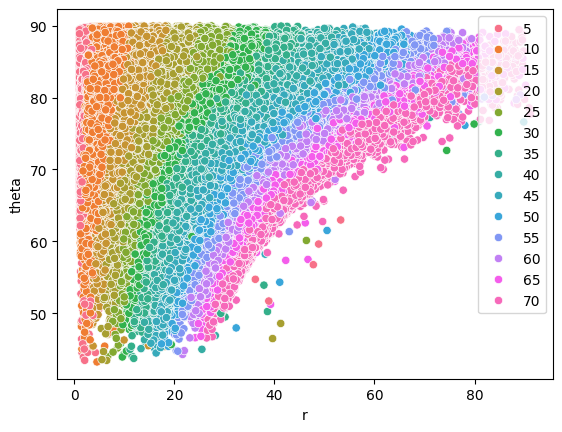

In [126]:
sns.scatterplot(data=df, x="r", y="theta", hue="price_bin")
plt.legend(loc='upper right')
plt.show()

### Polar Coordinates

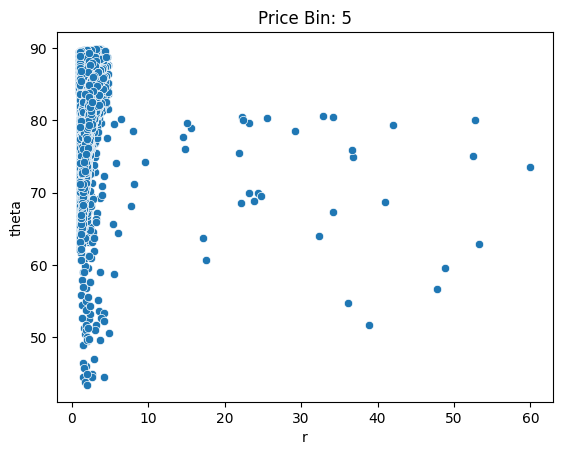

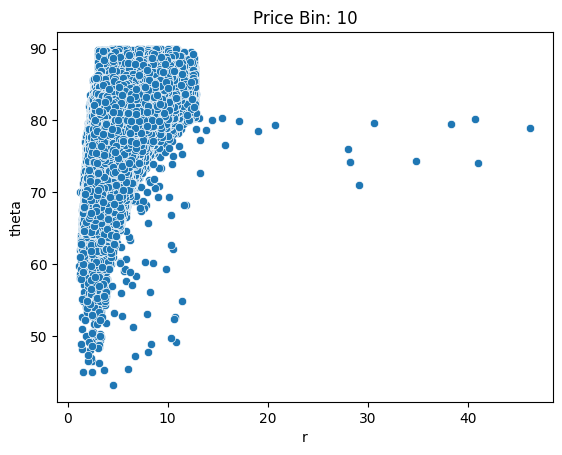

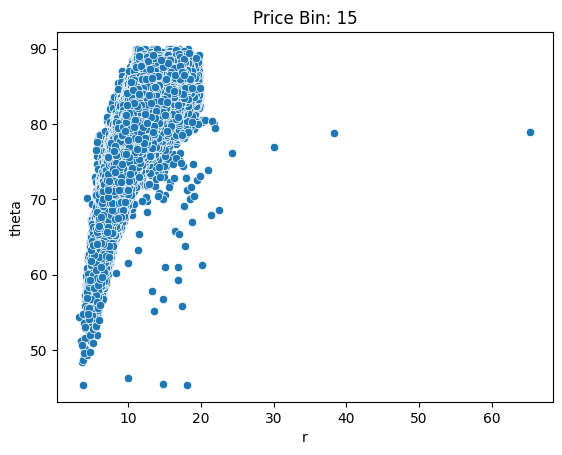

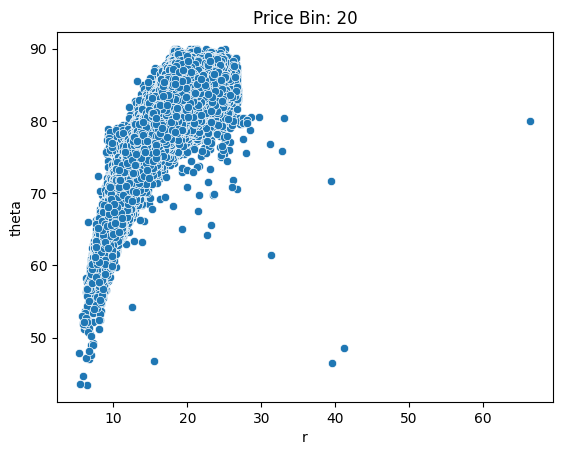

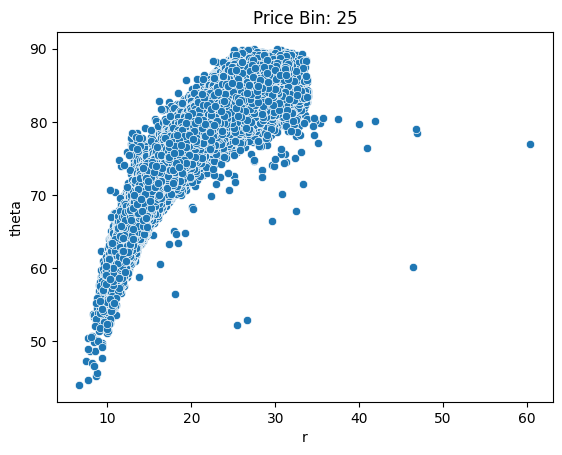

...

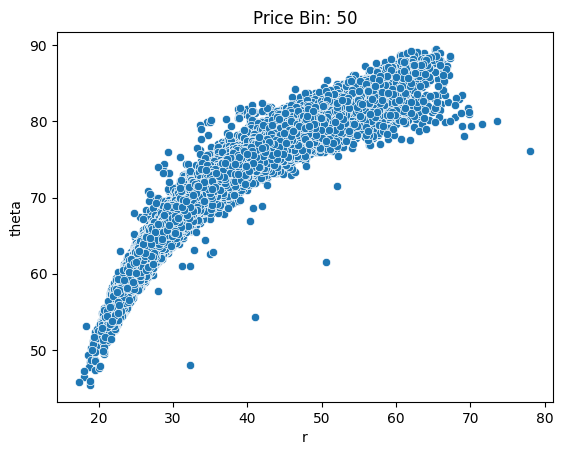

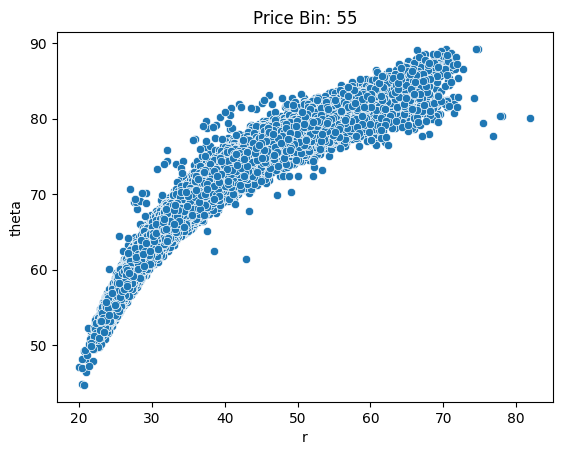

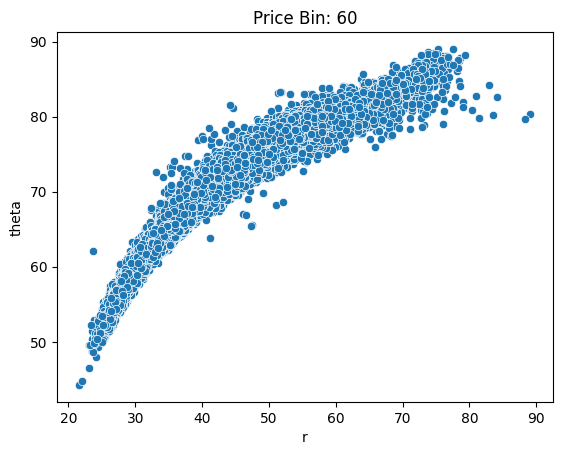

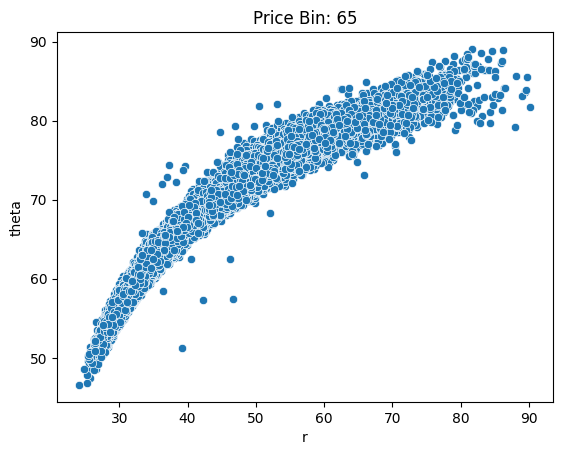

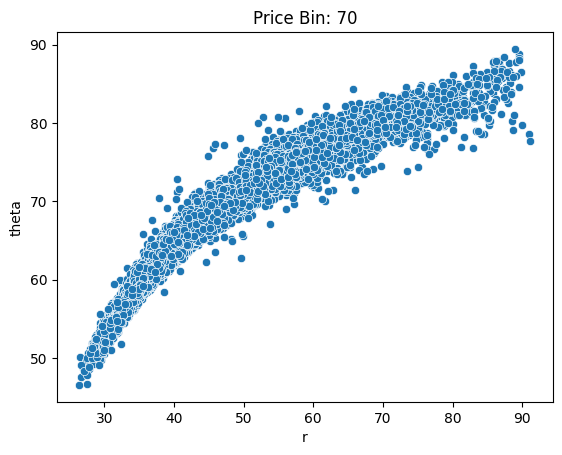

In [127]:
for bin in bins:
    sns.scatterplot(data=df.loc[df["price_bin"] == bin], x="r", y="theta")
    plt.title(f"Price Bin: {bin}")
    plt.show()

### Cartesian Coordinates

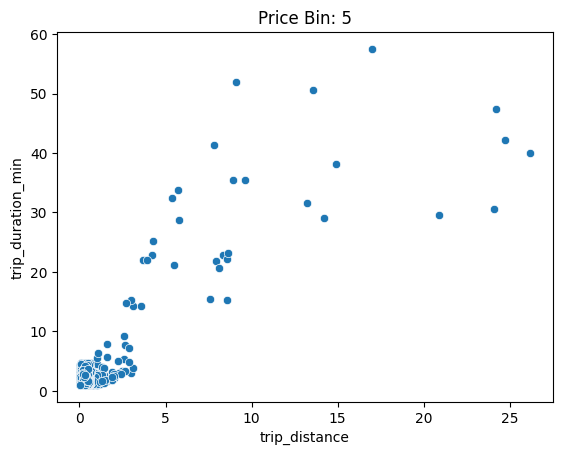

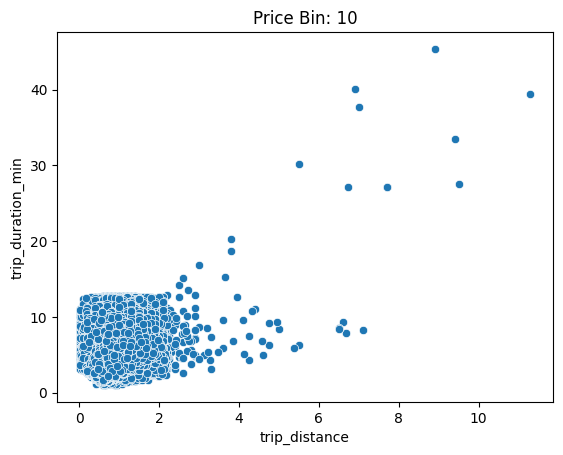

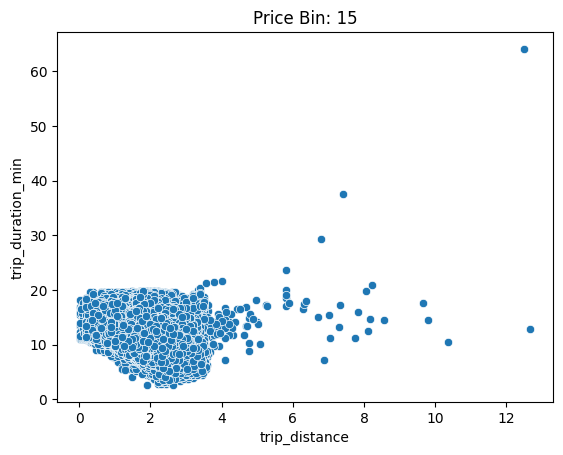

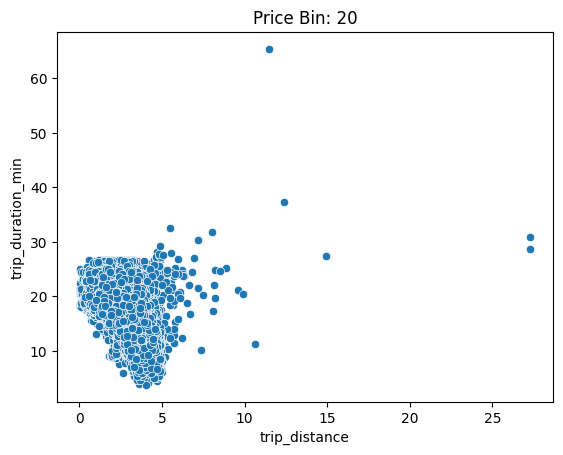

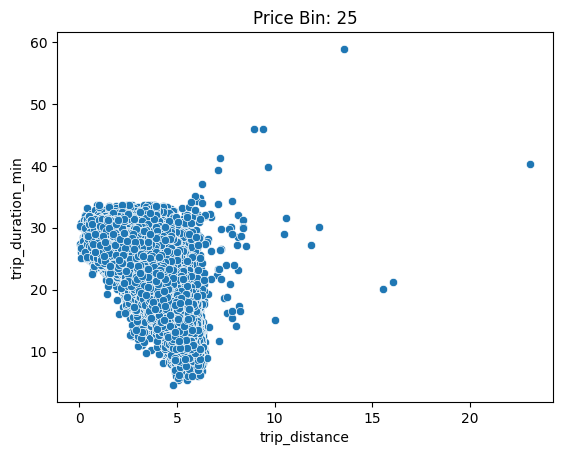

...

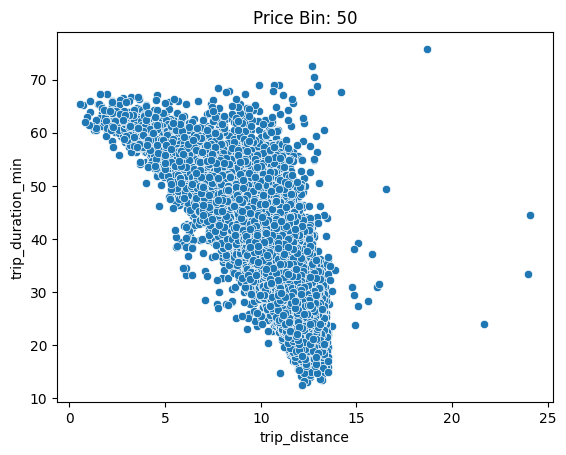

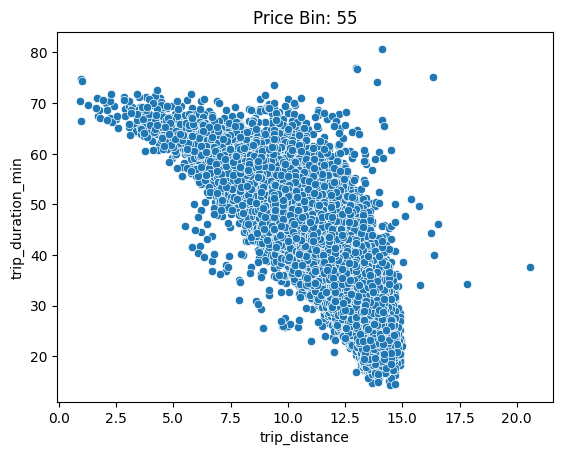

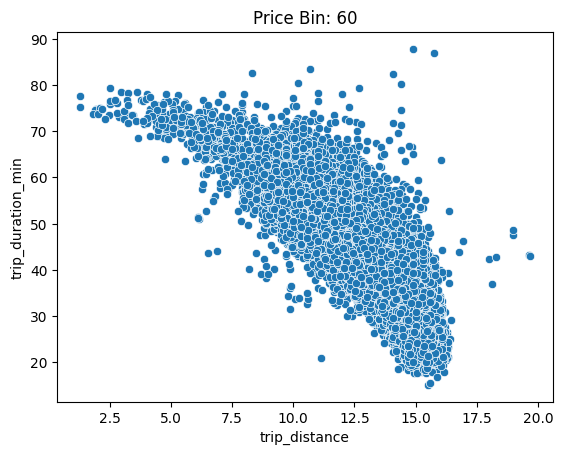

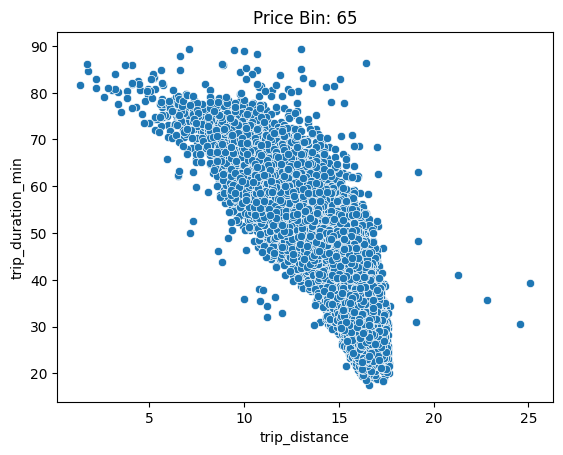

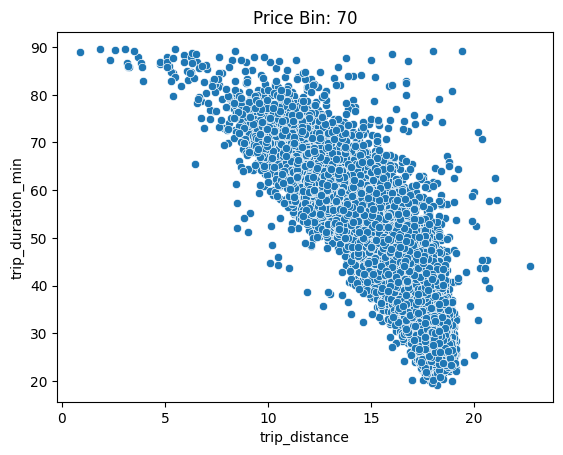

In [128]:
for bin in bins:
    sns.scatterplot(data=df.loc[df["price_bin"] == bin], x="trip_distance", y="trip_duration_min")
    plt.title(f"Price Bin: {bin}")
    plt.show()

## Removing The Last Outliers

At this point, it's not clear if any additional rules can be reliabely developed to remove outliers without being too heavy-handed.
It is still clear from examining the plots that outliers are present.
Now it is worth considering outlier detection algorithms to identify and remove outliers.
Let's look at Local Outlier Factor

5 , Number of samples:  5977


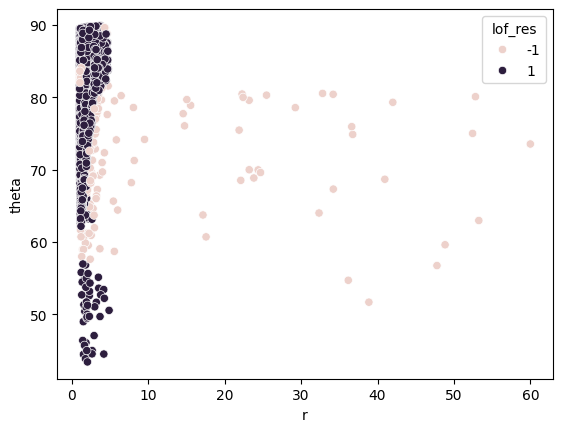

10 , Number of samples:  84054


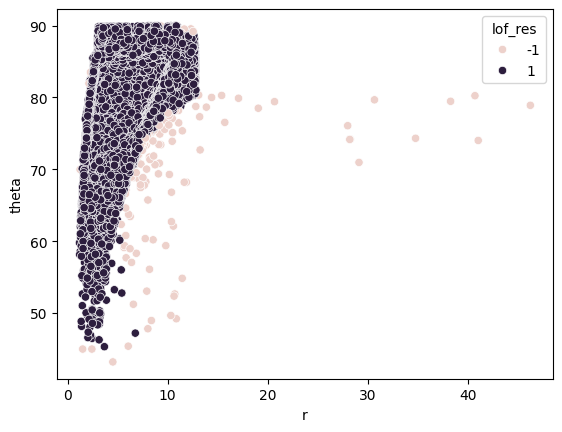

15 , Number of samples:  146237


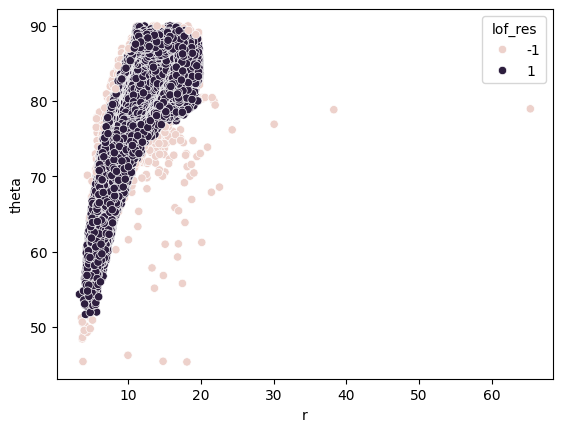

20 , Number of samples:  200414


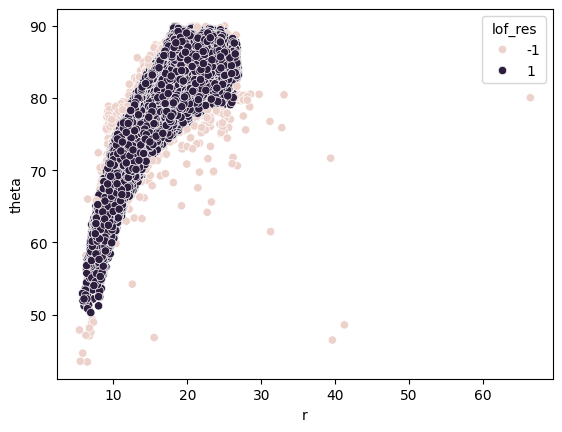

25 , Number of samples:  221727


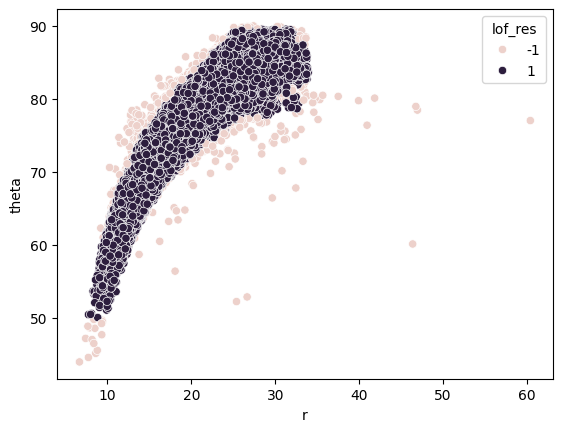

30 , Number of samples:  201901


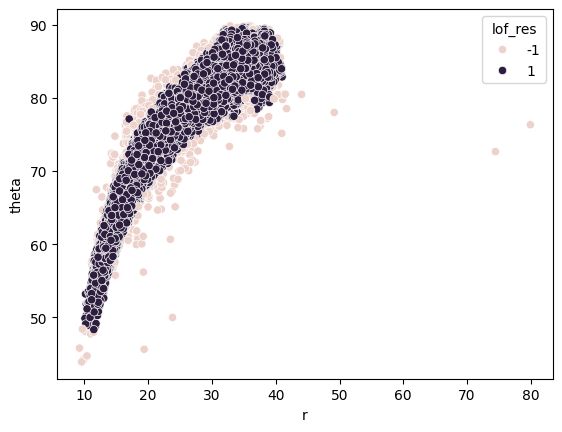

35 , Number of samples:  166427


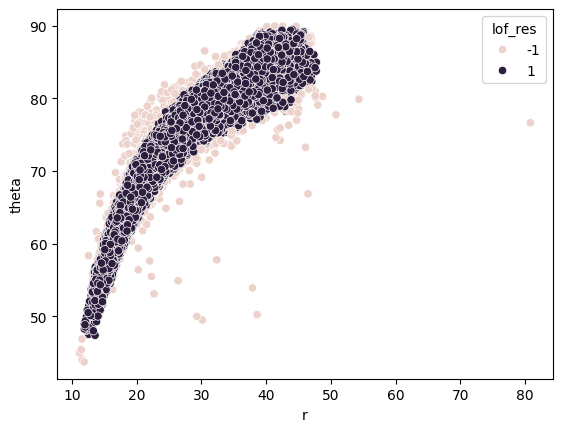

40 , Number of samples:  134583


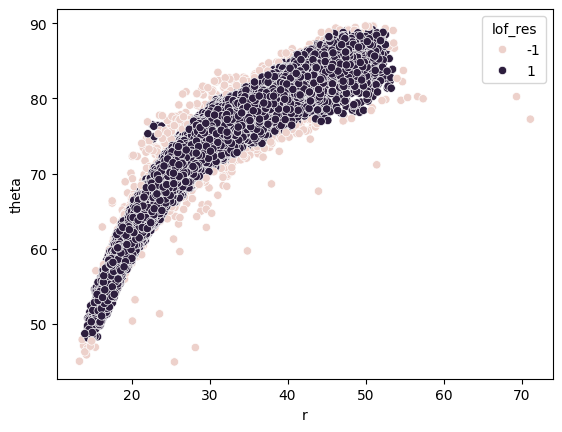

45 , Number of samples:  136318


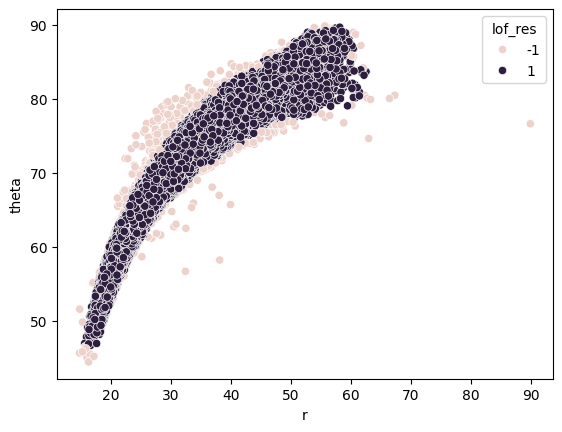

50 , Number of samples:  98304


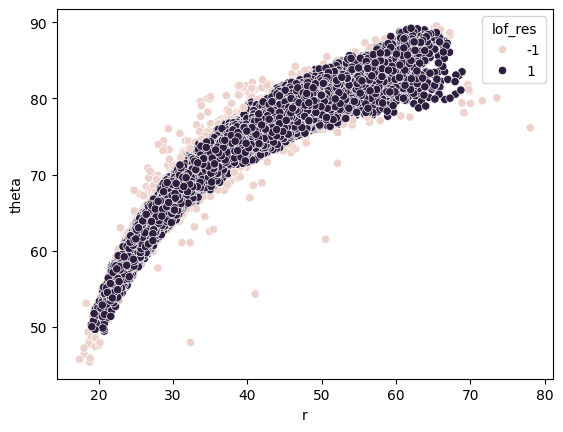

55 , Number of samples:  69068


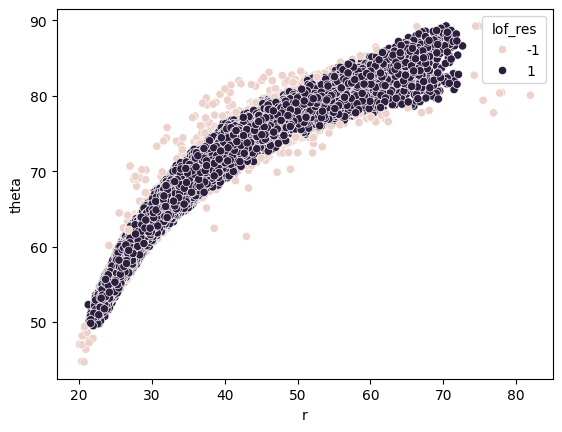

60 , Number of samples:  47588


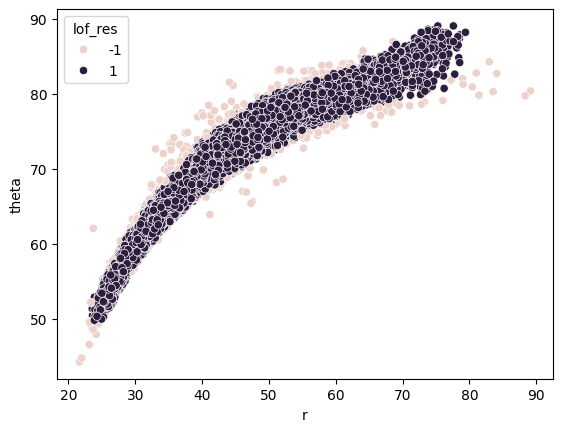

65 , Number of samples:  33982


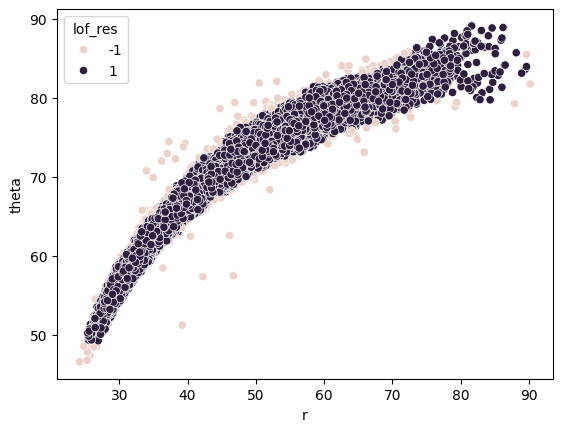

70 , Number of samples:  22522


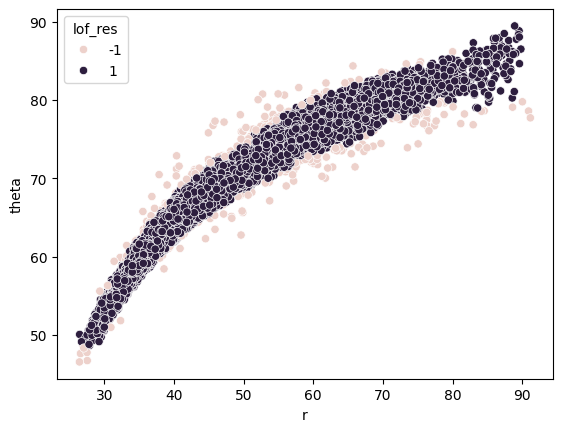

In [129]:
for bin in bins:
    temp_df = df[["r","theta"]].loc[df["price_bin"] == bin]
    temp_df = temp_df.drop_duplicates()
    lof_model = LocalOutlierFactor(n_jobs = -1, n_neighbors=40, leaf_size=40, p=2)
    lof_res = lof_model.fit_predict(temp_df)
    temp_df["lof_res"] = lof_res
    print(bin, ", Number of samples: ", temp_df.shape[0])
    sns.scatterplot(data=temp_df, x="r", y="theta", hue="lof_res")
    plt.show()

It looks like Local Outlier Facctor does a good job of spotting outliers for most price bins with some exceptions.
The $5, $10, $30, $40 price bins need some paraneter tweaking.
There will have to be a model fitted to each price bin.

### $5 Price Bin

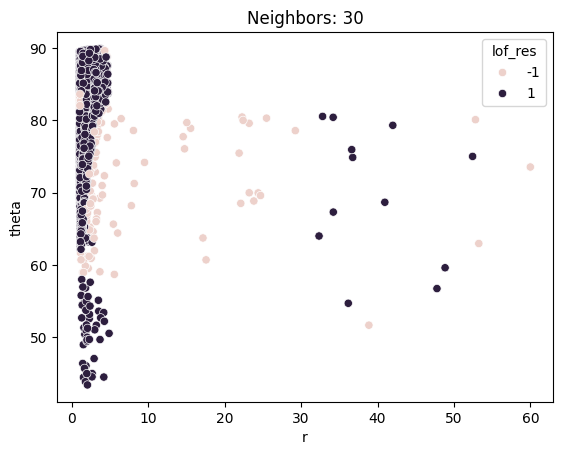

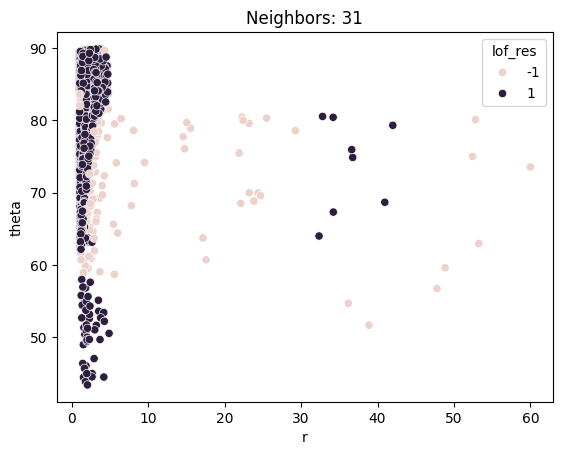

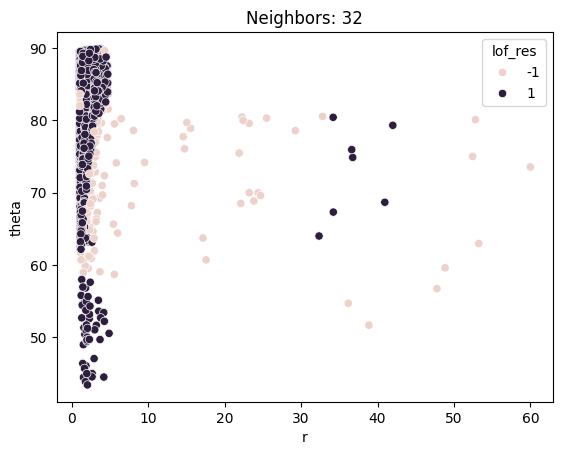

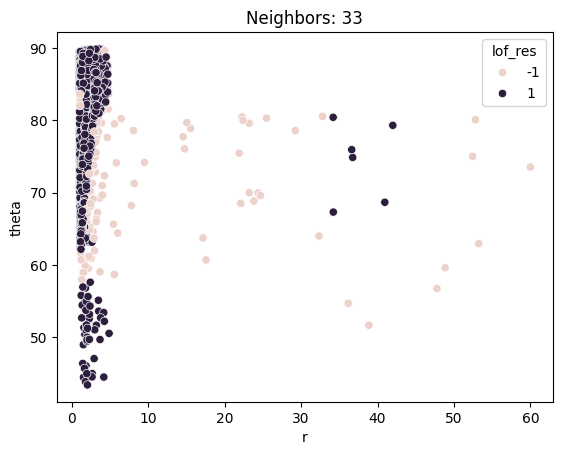

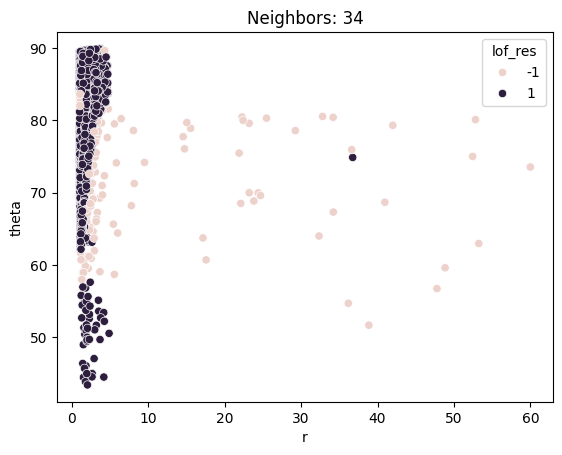

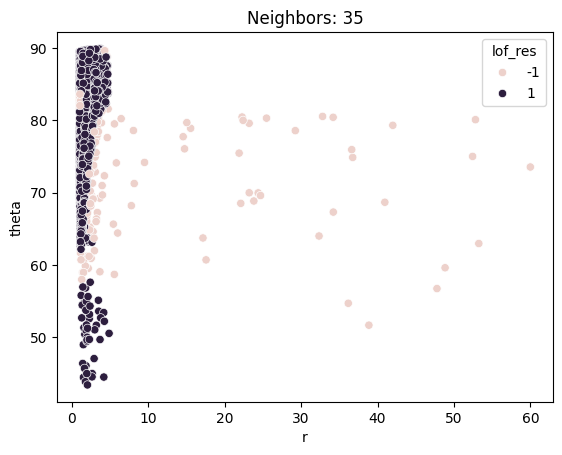

In [130]:
for neighbors in range(30,36):
    bin = 5
    temp_df = df[["r","theta"]].loc[df["price_bin"] == bin]
    temp_df = temp_df.drop_duplicates()
    lof_model = LocalOutlierFactor(n_jobs = -1, n_neighbors=neighbors, leaf_size=40, p=2)
    lof_res = lof_model.fit_predict(temp_df)
    temp_df["lof_res"] = lof_res
    plt.title(f"Neighbors: {neighbors}")
    sns.scatterplot(data=temp_df, x="r", y="theta", hue="lof_res")
    plt.show()

There doesn't seem to be a parameter for local outlier factor to make the $5 price bin fit well.
Considering this price bin has almost a purely radial relationship, the IQR method can be used to filter based on radius.

count    76121.000000
mean         2.140362
std          0.877941
min          1.020049
25%          1.704494
50%          2.141121
75%          2.449694
max         59.989173
Name: r, dtype: float64 

Lower Outlier Limit : 0.586694361942194
Upper Outlier Limit : 3.5674935563129972


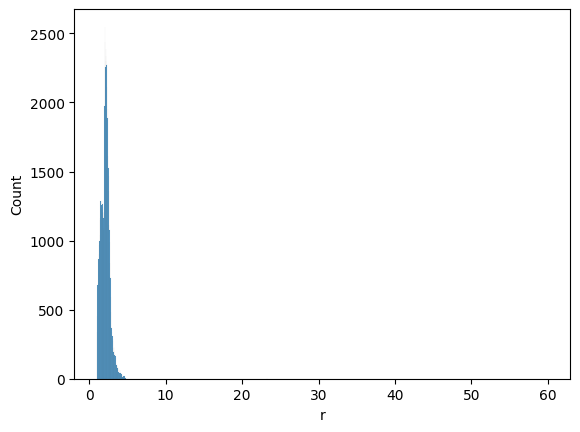

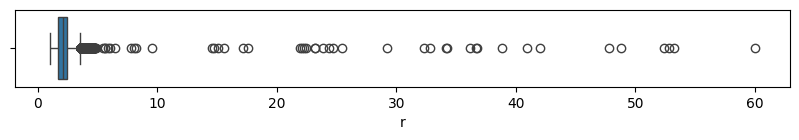

In [131]:
feat = "r"
bin = 5
temp_df = df[["r"]].loc[df["price_bin"] == bin]
summary = temp_df[feat].describe()
print(summary, "\n")
iqr = summary.loc["75%"] - summary.loc["25%"]
upper_limit = summary.loc["75%"] + 1.5*iqr
lower_limit = summary.loc["25%"] - 1.5*iqr
print("Lower Outlier Limit :", lower_limit)
print("Upper Outlier Limit :", upper_limit)

sns.histplot(data=temp_df, x=feat)
plt.show()
fig = plt.subplots(figsize=(10,1))
sns.boxplot(data=temp_df, x=feat)
plt.show()

A cutoff of 3.5675 will be applied.

### $10 Price Bin

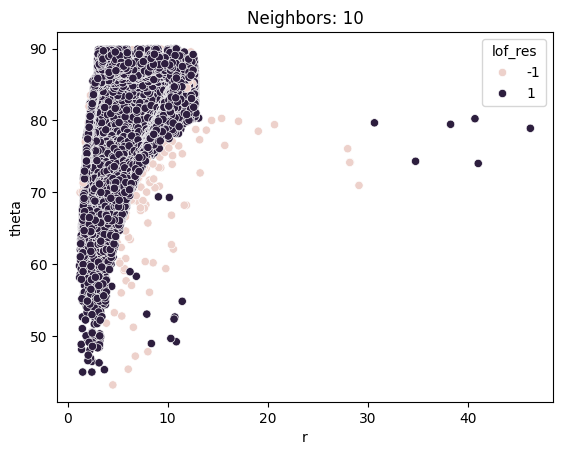

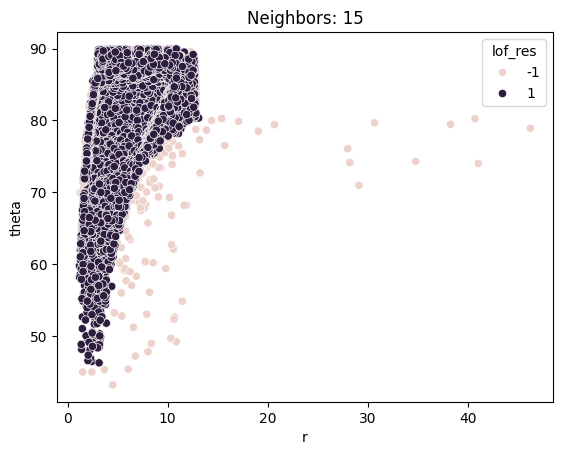

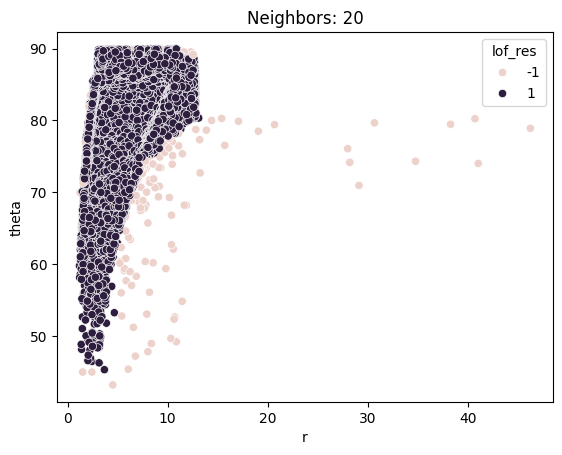

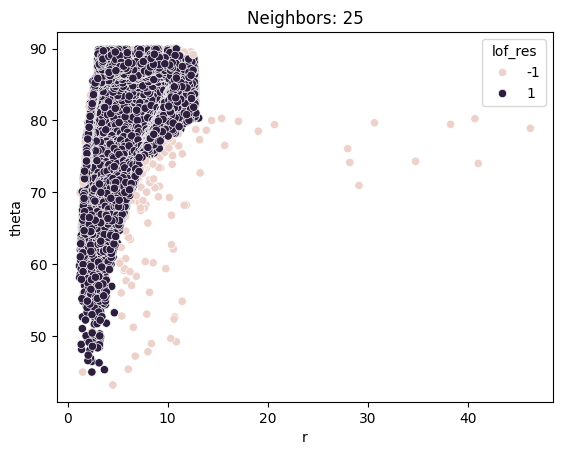

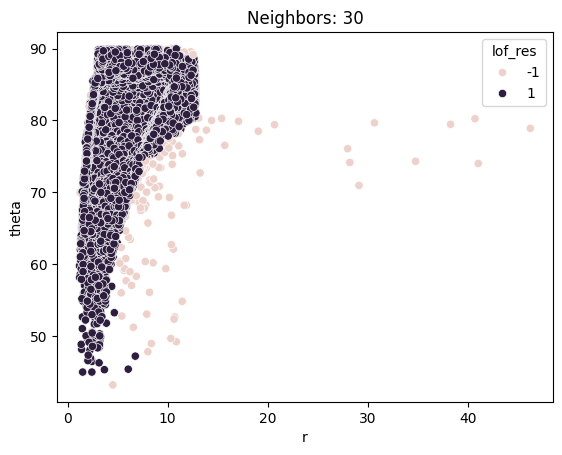

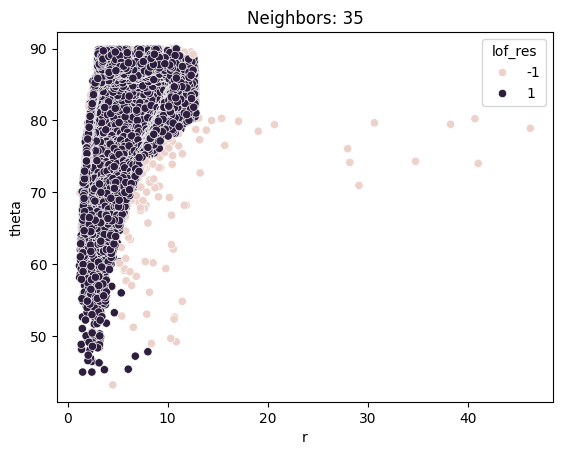

In [132]:
for neighbors in range(10,40,5):
    bin = 10
    temp_df = df[["r","theta"]].loc[df["price_bin"] == bin]
    temp_df = temp_df.drop_duplicates()
    lof_model = LocalOutlierFactor(n_jobs = -1, n_neighbors=neighbors, leaf_size=40, p=2)
    lof_res = lof_model.fit_predict(temp_df)
    temp_df["lof_res"] = lof_res
    plt.title(f"Neighbors: {neighbors}")
    sns.scatterplot(data=temp_df, x="r", y="theta", hue="lof_res")
    plt.show()

Neighbors = 15 is a good parameter to use

### $30 Price Bin

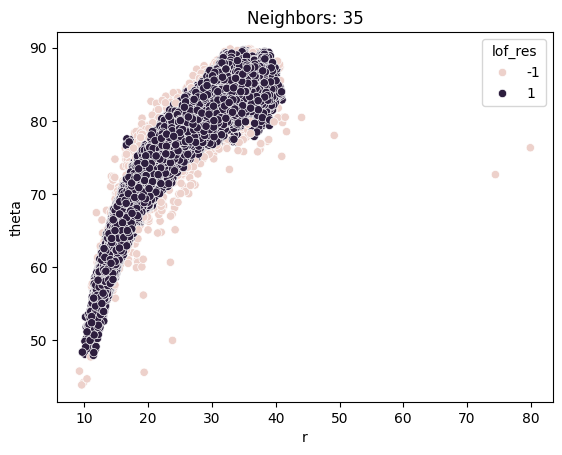

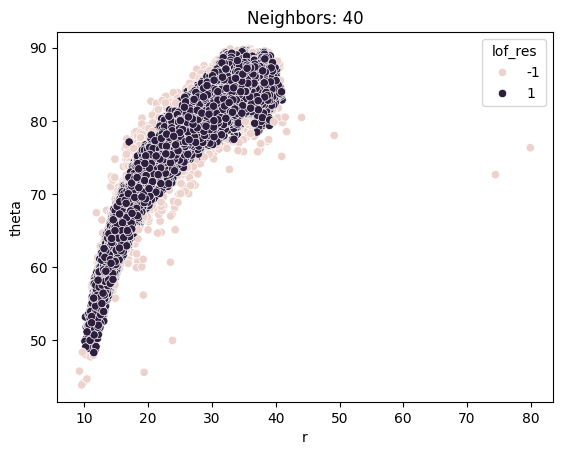

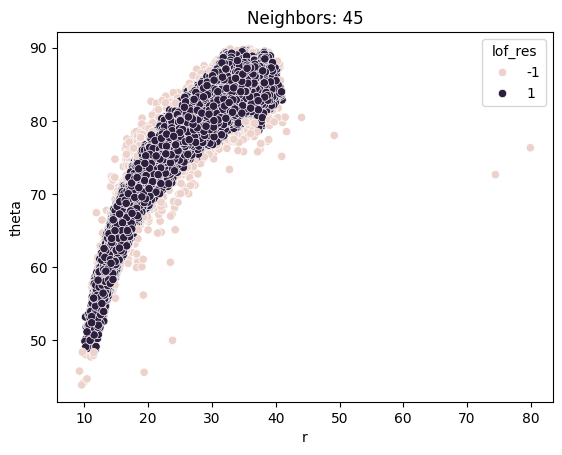

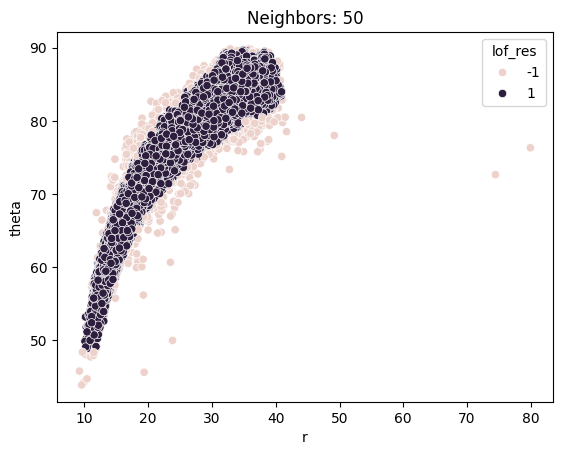

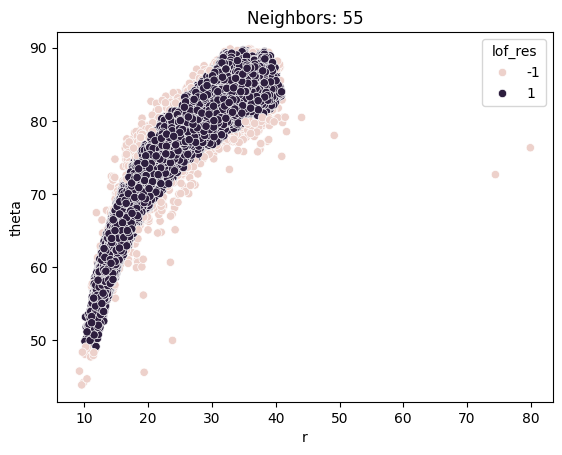

In [133]:
for neighbors in range(35,60,5):
    bin = 30
    temp_df = df[["r","theta"]].loc[df["price_bin"] == bin]
    temp_df = temp_df.drop_duplicates()
    lof_model = LocalOutlierFactor(n_jobs = -1, n_neighbors=neighbors, leaf_size=40, p=2)
    lof_res = lof_model.fit_predict(temp_df)
    temp_df["lof_res"] = lof_res
    plt.title(f"Neighbors: {neighbors}")
    sns.scatterplot(data=temp_df, x="r", y="theta", hue="lof_res")
    plt.show()

Neighbors = 50 is a good choice.

### $40 Price Bin

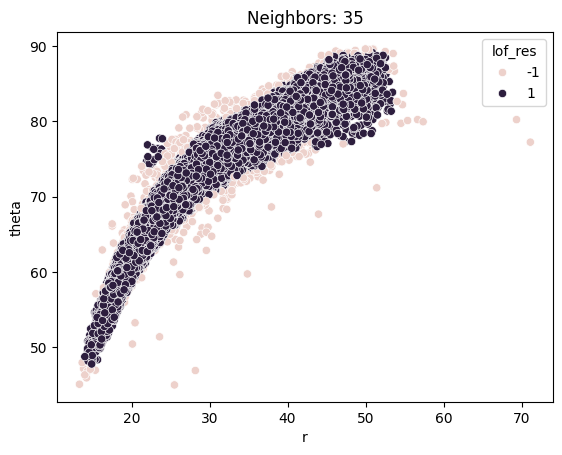

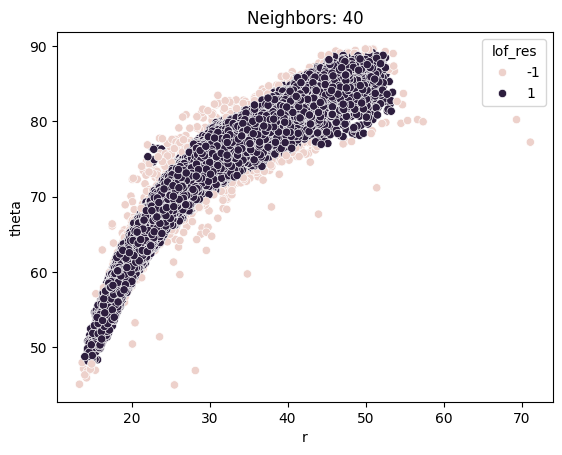

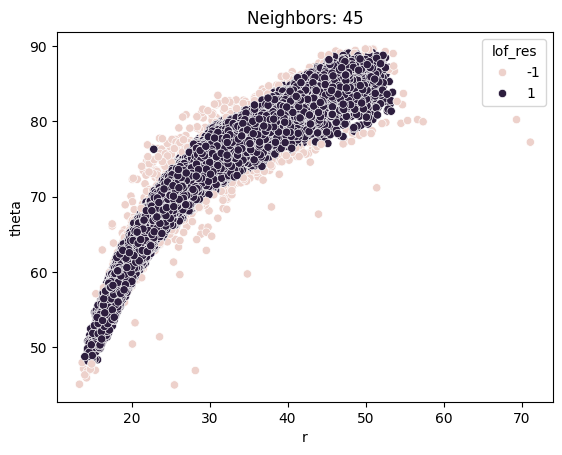

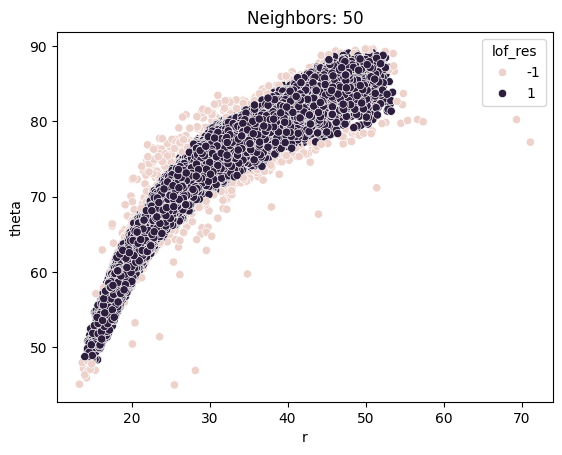

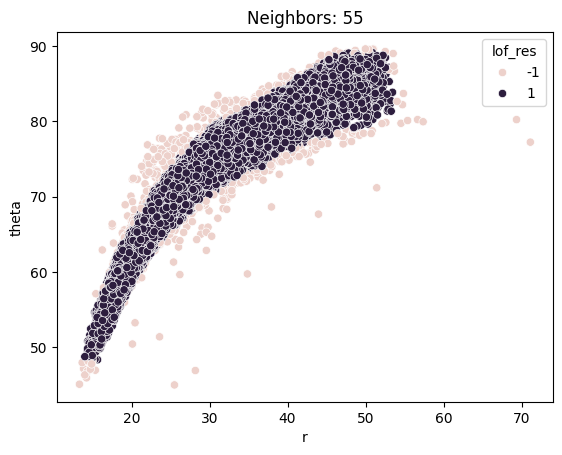

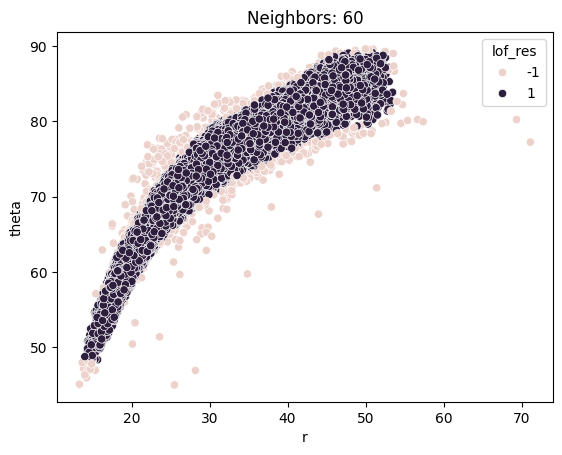

In [134]:
for neighbors in range(35,65,5):
    bin = 40
    temp_df = df[["r","theta"]].loc[df["price_bin"] == bin]
    temp_df = temp_df.drop_duplicates()
    lof_model = LocalOutlierFactor(n_jobs = -1, n_neighbors=neighbors, leaf_size=40, p=2)
    lof_res = lof_model.fit_predict(temp_df)
    temp_df["lof_res"] = lof_res
    plt.title(f"Neighbors: {neighbors}")
    sns.scatterplot(data=temp_df, x="r", y="theta", hue="lof_res")
    plt.show()

Neighbors = 50 is a good parameter to use

## Reviewing Data Cleaning Steps

1. Filter for speed
2. Filter for fare prices being too high
3. Filter for fare prices being to low for low travel speeds
4. Filter price bin = $5 for r values > 3.5
5. Using Local Outlier Factor algorithm to filter out outliers
    * Price bin 10, neighbors = 20
    * Price bin 30, neighbors = 50 
    * Price bin 40, neighbors = 50
    * Remaining price bins, neighbors = 40


Steps 1-3 have been completed already.
Steps 4 and 5 will be implimented and the resulting dataset will be saved.

In [169]:
idx = df.loc[(df["price_bin"] == 5) & (df["r"] > 3.5675)].index

In [170]:
df.drop(idx, inplace=True)

In [137]:
df_copy = df.copy()

In [166]:
df = df_copy.copy()

In [167]:
for bin in range(10,75,5):
    if bin == 10:
        neighbors = 20
    elif bin in (30,40):
        neighbors = 50
    else:
        neighbors = 40
    temp_df = df[["r","theta"]].loc[df["price_bin"] == bin]
    temp_df = temp_df.drop_duplicates()
    lof_model = LocalOutlierFactor(n_jobs = -1, n_neighbors=neighbors, leaf_size=40, p=2)
    lof_res = lof_model.fit_predict(temp_df)
    temp_df["lof_res"] = lof_res
    temp_df["price_bin"] = bin
    temp_df = temp_df.loc[temp_df["lof_res"] == -1]
    values_to_exclude = temp_df[["r", "theta","price_bin"]].to_numpy()
    values_to_exclude = tuple(map(tuple, values_to_exclude.tolist()))
    df = df[~df[["r","theta","price_bin"]].apply(tuple, axis=1).isin(values_to_exclude)]

Now let's look at the results to confirm the filtering made sense

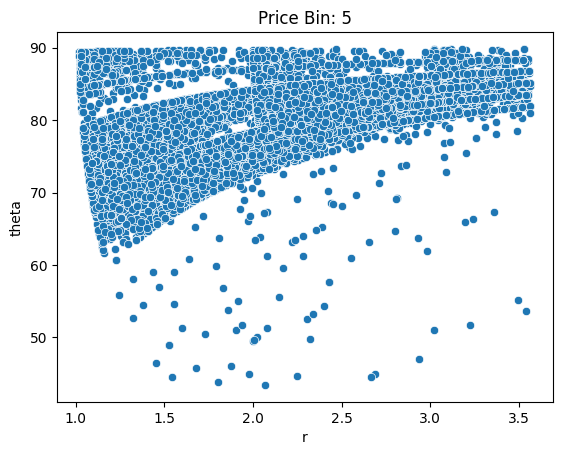

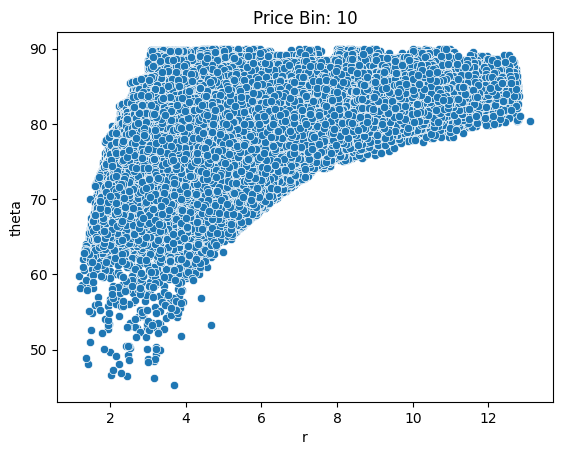

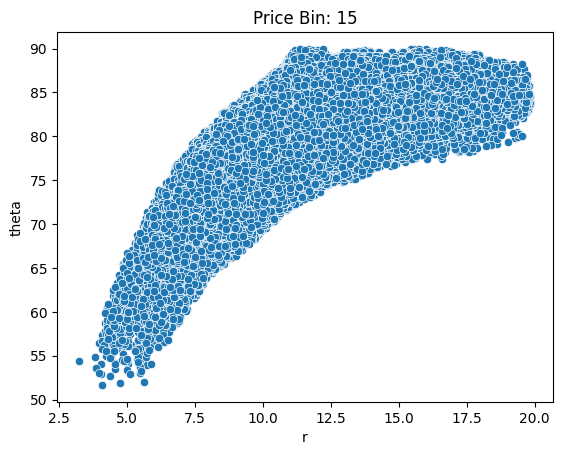

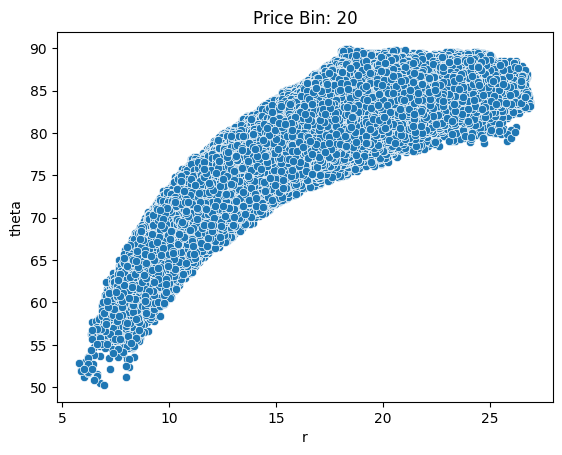

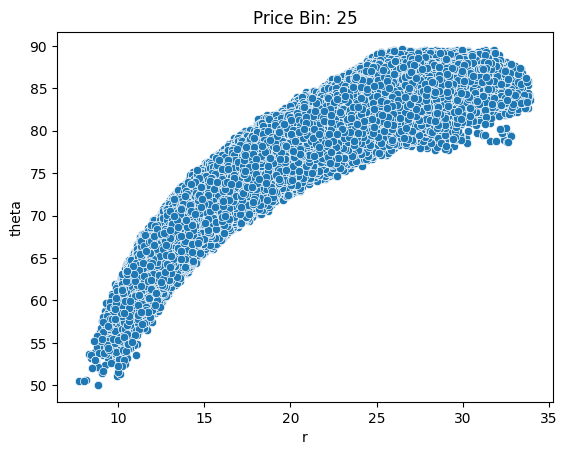

...

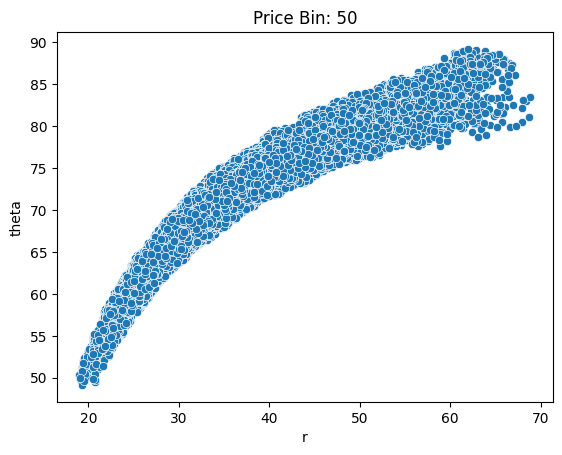

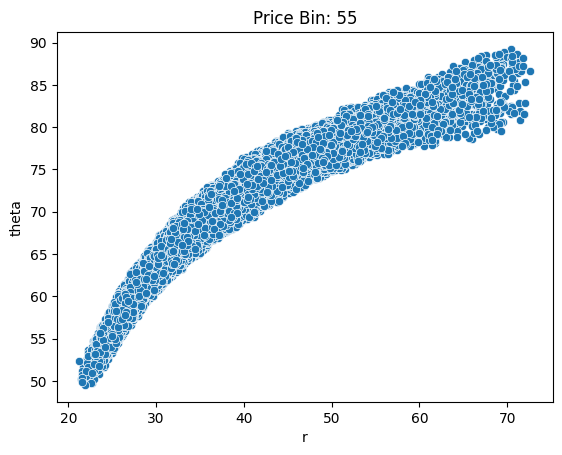

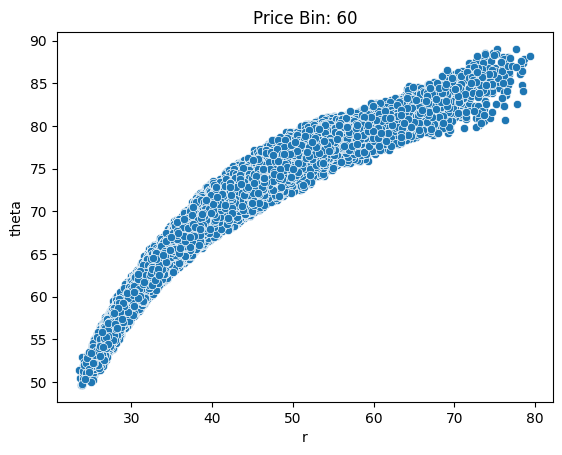

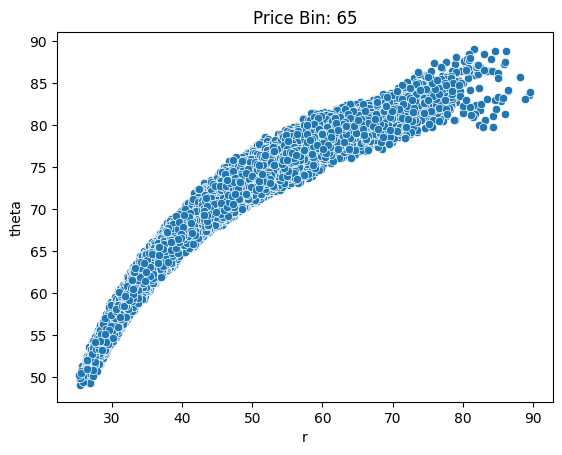

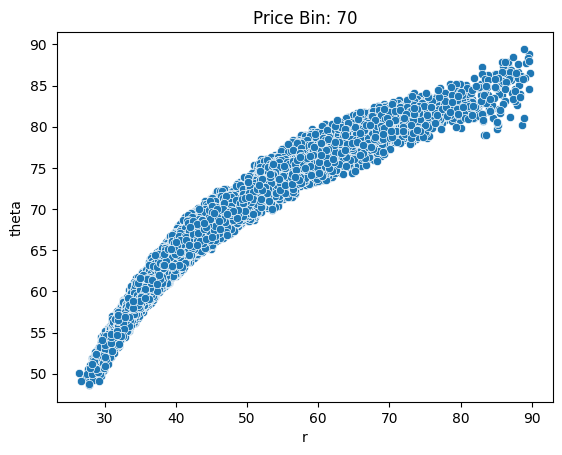

In [171]:
for bin in bins:
    sns.scatterplot(data=df.loc[df["price_bin"] == bin], x="r", y="theta")
    plt.title(f"Price Bin: {bin}")
    plt.show()

### Rows Removed

In [173]:
df.shape

(7709929, 7)

The original dataset had 7.785 million rows, and the rediced dataset has 7.709 million rows.
It is good to know that the data cleaning efforts didn't remove a significant portion of the rows.

## Saving the Data

In [172]:
df.to_parquet("/home/joe/datum/fare_amount_init_clean_6_8_2023.parquet")

Let's also examine duplicate data and then remove duplicate data to form a unique dataset.
It will be interesting to test out model performance without duplicate values to see how well the model performs.
Duplicate values of data points can potentially deflate or inflate model evaluation metrics.

In [183]:
df[["trip_distance", "trip_duration_min", "fare_amount", "r", "theta"]].value_counts()

trip_distance  trip_duration_min  fare_amount  r          theta    
0.70           4.53               6.5          4.583765   81.215824    269
               4.70               6.5          4.751842   81.528855    266
               4.55               6.5          4.603531   81.253838    265
               4.63               6.5          4.682617   81.402682    261
               4.60               6.5          4.652956   81.347458    259
                                                                      ... 
18.94          25.77              69.5         31.981502  53.685485      1
               28.35              69.5         34.094664  56.254002      1
18.90          27.88              69.5         33.682405  55.866446      1
               29.15              69.5         34.740934  57.041815      1
               29.28              69.5         34.850085  57.158089      1
Name: count, Length: 2337543, dtype: int64

In [184]:
df_unique = df[["trip_distance", "trip_duration_min", "fare_amount", "r", "theta"]].drop_duplicates()

In [185]:
df_unique.to_parquet("/home/joe/datum/fare_amount_init_clean_6_8_2023_unique.parquet")